In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def sigmoid(x):
    x = np.clip(x, -500, 500)
    return 1 / (1 + np.exp(-x))

def linear(x):
    return x

def sigmoid_der(x):
    return x * (1 - x)

def linear_der(x):
    return np.ones((len(x), 1))

def softmax(x):
    e_x = np.exp(x - np.max(x, axis=-1, keepdims=True))
    return e_x / np.sum(e_x, axis=-1, keepdims=True)


def softmax_der(x):
    return np.ones((len(x), 1))


def tanh(x):
    exp_x = np.exp(x)
    exp_m_x = np.exp(-x)
    return (exp_x - exp_m_x) / (exp_x + exp_m_x)

def tanh_der(x):
    return 1 - x**2

def relu(x):
    return np.maximum(0, x)

def relu_der(x):
    return (x > 0).astype(float)
    

def one_hot_encode(y, num_classes):
    one_hot = np.zeros((y.shape[0], num_classes))
    
    one_hot[np.arange(y.shape[0]), y.flatten()] = 1
    
    return one_hot

class MLP:
    def __init__(self, layer_sizes,
                 hidden_activation='sigmoid',
                 output_activation='linear', metric = 'mse'):
        self.activation_functions = {
            'sigmoid': sigmoid,
            'linear': linear,
            'softmax': softmax,
            'tanh': tanh,
            'relu': relu
        }

        self.activation_functions_der = {
            'sigmoid': sigmoid_der,
            'linear': linear_der,
            'softmax': softmax_der,
            'tanh': tanh_der,
            'relu': relu_der
        }

        self.metrics = {
            'mse': self.mse,
            'cross-entropy': self.cross_entropy,
        }

        # output_activation = "sigmoid" - tylko dla danych [0,1]
        self.metric = self.metrics[metric]
        if metric == "mse":
            self.measure = 0
        else:
            self.measure = 1
        self.hidden_activation = self.activation_functions[hidden_activation]
        self.output_activation = self.activation_functions[output_activation]
        self.loss = []
        self.output_activation_der = self.activation_functions_der[output_activation]
        self.hidden_activation_der = self.activation_functions_der[hidden_activation]
        self.weights_history = []
        self.biases_history = []
        self.layer_sizes = layer_sizes
        self.errors = []
        self.gradients = []
        self.lambda_reg = 0
        np.random.seed(42)
        self.momentum = 0
        self.weights = []
        self.biases = []
        self.epsilon = 1e-8
        self.moment_weights = []
        self.moment_biases = [] 

        # Inicjalizacja wag z normalizacją (Xavier)
        for i in range(len(layer_sizes) - 1):
            w = np.random.randn(layer_sizes[i], layer_sizes[i + 1]) / np.sqrt(layer_sizes[i])
            b = np.zeros((layer_sizes[i + 1],))
            self.weights.append(w)
            self.biases.append(b)

            self.moment_weights.append(np.zeros_like(w))
            self.moment_biases.append(np.zeros_like(b))


    def forward(self, X):
        if X.ndim == 1:
            X = X.reshape(1, -1)

        activation = X
        activations = [X]
        for i in range(len(self.weights) - 1):
            weights = self.weights[i]
            biases = self.biases[i]
            Y = activation @ self.weights[i] + self.biases[i]
            activation = self.hidden_activation(Y)
            activations.append(activation)

        Y = activation @ self.weights[-1] + self.biases[-1]
        activation = self.output_activation(Y)
        activations.append(activation)
        return activations

    def predict(self, X, norm):
        if norm == 0:
            return self.forward(X)[-1]
        else:
            X = (X - self.minX) / (self.maxX - self.minX)
            y_norm  = self.forward(X)[-1]
            return y_norm * (self.max - self.min) + self.min

    def set_weights_and_biases(self, layer_idx, W, b):
        self.weights[layer_idx] = W
        self.biases[layer_idx] = b

    def cross_entropy(self, y_true, y_pred):
        epsilon = 1e-15
        y_pred = np.clip(y_pred, epsilon, 1 - epsilon)
        cross_entropy_loss = -np.mean(np.sum(y_true * np.log(y_pred), axis=1))
        
        return cross_entropy_loss


    def mse(self, y_true, y_pred):
        diff = y_true - y_pred
        diff = np.clip(diff, -1e150, 1e150)  
        return np.mean((diff) ** 2)
    

    def f1_score(self, y_true, y_pred):
        
        TP = np.sum(y_true * y_pred, axis=0)
        FP = np.sum((1 - y_true) * y_pred, axis=0)
        FN = np.sum(y_true * (1 - y_pred), axis=0)
        
        precision = TP / (TP + FP + 1e-8)
        recall = TP / (TP + FN + 1e-8)
        
        f1 = 2 * (precision * recall) / (precision + recall + 1e-8)
        
        return np.mean(f1)
        
    def convert_to_class_indices(self, y_pred):
        return np.argmax(y_pred, axis=1)    
    
    def softmax_to_one_hot(self, y_pred):

        y_pred_one_hot = np.zeros_like(y_pred) 
        
        class_predictions = np.argmax(y_pred, axis=1) 
        
        y_pred_one_hot[np.arange(y_pred.shape[0]), class_predictions] = 1
        
        return y_pred_one_hot

    def backpropagate(self, X, y_true, activations):
        output = activations[-1] 
        error = output - y_true 
        # self.errors.append(np.mean(np.square(error)))

        delta = error * self.output_activation_der(output)
        deltas = [delta]

        for i in range(len(self.weights) - 2, -1, -1):
            delta = deltas[-1] @ self.weights[i + 1].T * self.hidden_activation_der(activations[i + 1])
            deltas.append(delta)

        deltas.reverse()
        return deltas


    def update_weights_and_biases(self, activations, deltas, learning_rate):
        for i in range(len(self.weights)):
            activation = activations[i]
            delta = deltas[i]
            self.weights[i] -= learning_rate * activation.T @ delta
            # self.weights[i] -= learning_rate * (activation.T @ delta + self.lambda_reg * self.weights[i])
            self.biases[i] -= learning_rate * np.sum(delta, axis=0)

    def update_weights_and_biases_reg(self, activations, deltas, learning_rate, reg):
        for i in range(len(self.weights)):
            activation = activations[i]
            delta = deltas[i]
            if reg == 1:
                self.weights[i] -= learning_rate * (activation.T @ delta + self.lambda_reg * np.sign(self.weights[i]))
            if reg == 2:
                self.weights[i] -= learning_rate * (activation.T @ delta + 2 * self.lambda_reg * self.weights[i])

            self.biases[i] -= learning_rate * np.sum(delta, axis=0)


    def update_weights_and_biases_momentum(self, activations, deltas, learning_rate):
        for i in range(len(self.weights)):
            activation = activations[i]
            delta = deltas[i]

            gradient_w = activation.T @ delta
            gradient_b = np.sum(delta, axis=0)

            self.moment_weights[i] = self.momentum * self.moment_weights[i] - learning_rate * gradient_w
            self.moment_biases[i] = self.momentum * self.moment_biases[i] - learning_rate * gradient_b
            self.weights[i] += self.moment_weights[i]
            self.biases[i] += self.moment_biases[i]


    def update_weights_and_biases_RMS(self, activations, deltas, learning_rate):
        for i in range(len(self.weights)):
            activation = activations[i]
            delta = deltas[i]

            gradient_w = activation.T @ delta
            gradient_b = np.sum(delta, axis=0)

            self.moment_weights[i] = (1 - self.momentum) * (gradient_w ** 2) + self.momentum * self.moment_weights[i]
            self.moment_biases[i] = (1 - self.momentum) * (gradient_b ** 2) + self.momentum * self.moment_biases[i]

            self.weights[i] -= learning_rate * gradient_w / (np.sqrt(self.moment_weights[i]) + self.epsilon)
            self.biases[i] -= learning_rate * gradient_b / (np.sqrt(self.moment_biases[i]) + self.epsilon)


    def fit(self, X, y, epochs=1000, learning_rate=0.01, er=3, momentum=0, RMS=0, reg=0, lambda_reg=0, 
        test_stop=0, patience=float('inf'), X_test=None, y_test=None, norm=0):
    
        self.momentum = momentum
        self.lambda_reg = lambda_reg
        m = X.shape[0]
        patience_counter = 0
        best_test_loss = float('inf') if self.measure == 0 else -float('inf')

        if norm == 1:
            self.min = min(y)
            self.max = max(y)
            self.minX = min(X)
            self.maxX = max(X)
            X = (X - self.minX) / (self.maxX - self.minX)
            y_norm = (y - self.min) / (self.max - self.min)
        else:
            y_norm = y

        for epoch in range(epochs):
            activations = self.forward(X)
            y_pred = self.predict(X, norm)
            error = self.metric(y, y_pred)
            self.errors.append(error)

            if self.measure == 0:
                loss = self.mse(y, y_pred)
                if loss < er:
                    print("finished_early on epoch: ", epoch, ", with loss = ", loss)
                    break
            else:
                loss = self.f1_score(y, self.softmax_to_one_hot(y_pred))
                if loss > er:
                    print("finished_early on epoch: ", epoch, ", with f-measure = ", loss)
                    break
            self.loss.append(loss)

            # Early stopping na zbiorze testowym
            if test_stop == 1 and X_test is not None and y_test is not None:
                if self.measure == 0:
                    current_test_loss = self.mse(y_test, self.predict(X_test, norm))
                    if current_test_loss < best_test_loss:
                        best_test_loss = current_test_loss
                        patience_counter = 0
                    else:
                        patience_counter += 1
                else:
                    current_test_loss = self.f1_score(y_test, self.softmax_to_one_hot(self.predict(X_test, norm)))
                    if current_test_loss > best_test_loss:
                        best_test_loss = current_test_loss
                        patience_counter = 0
                    else:
                        patience_counter += 1

                if patience_counter >= patience:
                    print(f"Early stopping on epoch {epoch}: no improvement for {patience} epochs.")
                    break

            self.loss.append(loss)

            # Backpropagation & update
            deltas = self.backpropagate(X, y_norm, activations)
            if RMS == 1:
                self.update_weights_and_biases_RMS(activations, deltas, learning_rate)
            elif reg > 0:
                self.update_weights_and_biases_reg(activations, deltas, learning_rate, reg)
            elif RMS == 0 and self.momentum == 0:
                self.update_weights_and_biases(activations, deltas, learning_rate)
            else:
                self.update_weights_and_biases_momentum(activations, deltas, learning_rate)

            self.weights_history.append([w.copy() for w in self.weights])
            self.biases_history.append([w.copy() for w in self.biases])

            if (epoch + 1) % 1000 == 0 or epoch == epochs - 1:
                if X_test is not None and y_test is not None:
                    if self.measure == 0:
                        current_test_loss = self.mse(y_test, self.predict(X_test, norm))
                    else:
                        current_test_loss = self.f1_score(y_test, self.softmax_to_one_hot(self.predict(X_test, norm)))
                    print(f'Epoch {epoch + 1}/{epochs}, Train Loss: {loss}, Test Loss: {current_test_loss}')
                else:
                    print(f'Epoch {epoch + 1}/{epochs}, Train Loss: {loss}, Error: {error}')


        # Wykres końcowy
        plt.plot(self.loss)
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title('Training Loss')
        plt.show()



    def visualize_weights(self, layer_idx):

        if not self.weights_history:
            print("Brak danych o wagach. Uruchom najpierw metodę fit().")
            return

        weights_for_layer = np.array([weights[layer_idx] for weights in self.weights_history])

        plt.figure(figsize=(12, 6))
        for i in range(weights_for_layer.shape[1]):
            for j in range(weights_for_layer.shape[2]):
                plt.plot(weights_for_layer[:, i, j], label=f'Neuron {i}-{j}')

        plt.xlabel("Epoch")
        plt.ylabel("Weight Value")
        plt.title(f"Weight Changes for Layer {layer_idx} Over Epochs")
        plt.legend(loc='upper right', fontsize=8)
        plt.tight_layout()
        plt.show()

    def visualize_biases(self, layer_idx):
        if not self.weights_history:
            print("Brak danych o biasach. Uruchom najpierw metodę fit().")
            return

        biases_for_layer = np.array([bias[layer_idx] for bias in self.biases_history])

        if biases_for_layer.ndim == 1:
            plt.plot(biases_for_layer, label=f"Bias w warstwie {layer_idx}", color='red')
        else:
            plt.figure(figsize=(12, 6))
            for i in range(biases_for_layer.shape[1]):
                plt.plot(biases_for_layer[:, i], label=f'Bias {i} w warstwie {layer_idx}')

        plt.xlabel("Epoki")
        plt.ylabel("Wartość biasu")
        plt.title(f"Wartości biasów dla warstwy {layer_idx} w trakcie treningu")
        plt.legend()
        plt.tight_layout()
        plt.show()


    def fit_batch(self, X, y, epochs=1000, learning_rate=0.01, er=3, momentum=0, RMS=0, reg=0, lambda_reg=0, 
                test_stop=0, patience=float('inf'), X_test=None, y_test=None, norm=0, batch_size=32):
        m = X.shape[0]
        self.momentum = momentum
        self.lambda_reg = lambda_reg
        patience_counter = 0
        best_test_loss = float('inf') if self.measure == 0 else -float('inf')

        if norm == 1:
            self.min = min(y)
            self.max = max(y)
            self.minX = min(X)
            self.maxX = max(X)
            X = (X - self.minX) / (self.maxX - self.minX)
            y_norm = (y - self.min) / (self.max - self.min)
        else:
            y_norm = y

        for epoch in range(epochs):
            # Losowanie danych w batchach
            indices = np.random.permutation(m)
            X_shuffled = X[indices]
            y_shuffled = y[indices]

            for start_idx in range(0, m, batch_size):
                end_idx = min(start_idx + batch_size, m)
                X_batch = X_shuffled[start_idx:end_idx]
                y_batch = y_shuffled[start_idx:end_idx]

                activations = self.forward(X_batch)
                y_pred = self.predict(X_batch, norm)
                error = self.metric(y_batch, y_pred)
                self.errors.append(error)

                if self.measure == 0:
                    loss = self.mse(y_batch, y_pred)
                    if loss < er:
                        print("finished_early on epoch: ", epoch, ", with loss = ", loss)
                        break
                else:
                    loss = self.f1_score(y_batch, self.softmax_to_one_hot(y_pred))
                    if loss > er:
                        print("finished_early on epoch: ", epoch, ", with f-measure = ", loss)
                        break
                self.loss.append(loss)

                # Early stopping na zbiorze testowym
                if test_stop == 1 and X_test is not None and y_test is not None:
                    if self.measure == 0:
                        current_test_loss = self.mse(y_test, self.predict(X_test, norm))
                        if current_test_loss < best_test_loss:
                            best_test_loss = current_test_loss
                            patience_counter = 0
                        else:
                            patience_counter += 1
                    else:
                        current_test_loss = self.f1_score(y_test, self.softmax_to_one_hot(self.predict(X_test, norm)))
                        if current_test_loss > best_test_loss:
                            best_test_loss = current_test_loss
                            patience_counter = 0
                        else:
                            patience_counter += 1

                    if patience_counter >= patience:
                        print(f"Early stopping on epoch {epoch}: no improvement for {patience} epochs.")
                        break

                # Backpropagation & update
                deltas = self.backpropagate(X_batch, y_norm[start_idx:end_idx], activations)
                if RMS == 1:
                    self.update_weights_and_biases_RMS(activations, deltas, learning_rate)
                elif reg > 0:
                    self.update_weights_and_biases_reg(activations, deltas, learning_rate, reg)
                elif RMS == 0 and self.momentum == 0:
                    self.update_weights_and_biases(activations, deltas, learning_rate)
                else:
                    self.update_weights_and_biases_momentum(activations, deltas, learning_rate)

                self.weights_history.append([w.copy() for w in self.weights])
                self.biases_history.append([b.copy() for b in self.biases])

            # Early stopping po całym epoce
            if test_stop == 0 and X_test is not None and y_test is not None:
                if self.measure == 0:
                    current_test_loss = self.mse(y_test, self.predict(X_test, norm))
                else:
                    current_test_loss = self.f1_score(y_test, self.softmax_to_one_hot(self.predict(X_test, norm)))

                print(f'Epoch {epoch + 1}/{epochs}, Train Loss: {loss}, Test Loss: {current_test_loss}')
            else:
                print(f'Epoch {epoch + 1}/{epochs}, Train Loss: {loss}, Error: {error}')

            # Warunki zakończenia w przypadku early stopping
            if patience_counter >= patience:
                break

        # Wykres końcowy
        plt.plot(self.loss)
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title('Training Loss')
        plt.show()


## Zbiór multimodal sparse

#### uczenie bez ulepszeń

Epoch 1000/500000, Train Loss: 5195.9322737452885, Test Loss: 4478.459292920167
Epoch 2000/500000, Train Loss: 4863.871056232172, Test Loss: 4178.501334483256
Epoch 3000/500000, Train Loss: 4617.187220088633, Test Loss: 3969.3553061178
Epoch 4000/500000, Train Loss: 4322.684032926886, Test Loss: 3758.9782917051443
Epoch 5000/500000, Train Loss: 4057.8565491103836, Test Loss: 3582.8340324979204
Epoch 6000/500000, Train Loss: 3860.6965866279397, Test Loss: 3454.5848708358444
Epoch 7000/500000, Train Loss: 3719.0263486237877, Test Loss: 3363.3678101789515
Epoch 8000/500000, Train Loss: 3615.059656982465, Test Loss: 3295.371879846826
Epoch 9000/500000, Train Loss: 3535.669309963778, Test Loss: 3240.428395415968
Epoch 10000/500000, Train Loss: 3469.323538763053, Test Loss: 3190.539583957574
Epoch 11000/500000, Train Loss: 3408.101284866716, Test Loss: 3140.5769556554096
Epoch 12000/500000, Train Loss: 3345.9895164074615, Test Loss: 3087.1641415952063
Epoch 13000/500000, Train Loss: 3278.519

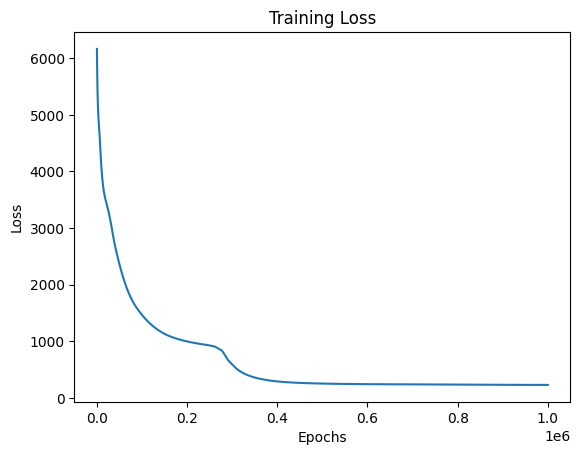

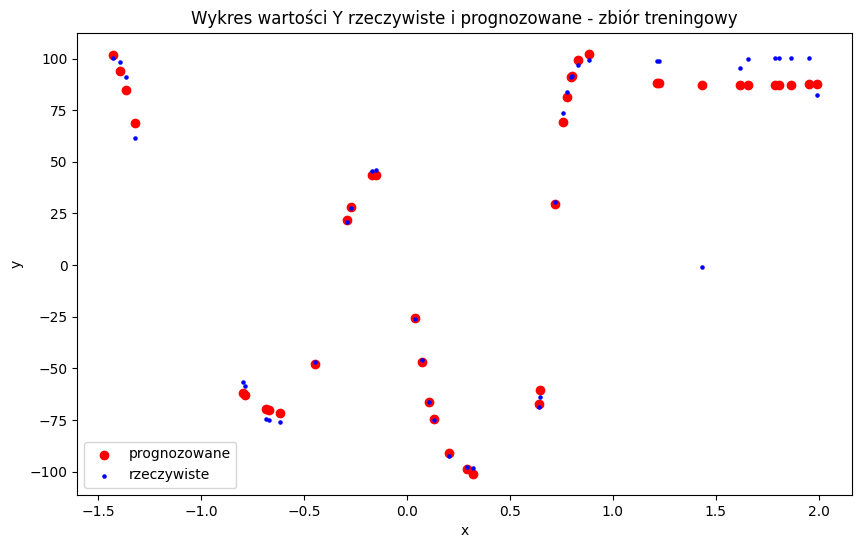

Train MSE =  229.73842409701206
 Test MSE =  530.8289231418051


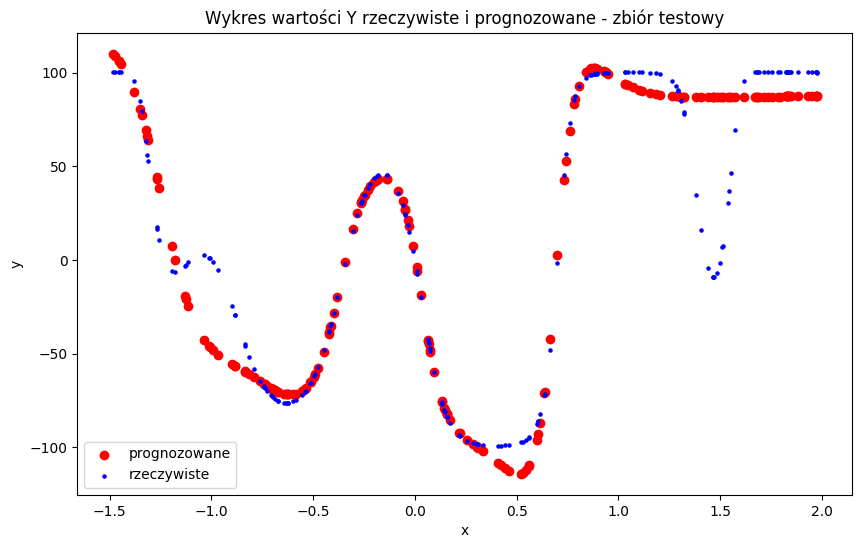

In [ ]:
df = pd.read_csv('mio1/regression/multimodal-sparse-training.csv')
X=df.iloc[:,0].to_numpy().reshape(-1,1)
y_true=df.iloc[:,1].to_numpy().reshape(-1,1)

df = pd.read_csv('mio1/regression/multimodal-sparse-test.csv')
X_test=df.iloc[:,0].to_numpy().reshape(-1,1)
y_true_test=df.iloc[:,1].to_numpy().reshape(-1,1)
mlp = MLP( [1,64, 1] ,'tanh')

mlp.fit(X, y_true,500000, 0.000001, er=0, momentum=0, RMS=0,lambda_reg=0,test_stop=0,patience=float('inf'), X_test=X_test, y_test=y_true_test, norm=0)

y_pred = mlp.predict(X,0)


mse_error = mlp.mse(y_true, y_pred)
plt.figure(figsize=(10, 6))
plt.scatter(X, y_pred, label='prognozowane', color='red')
plt.scatter(X, y_true, label='rzeczywiste', color='blue', s=5)
plt.title('Wykres wartości Y rzeczywiste i prognozowane - zbiór treningowy')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()
print("Train MSE = ", mse_error)

y_pred = mlp.predict(X_test,0)
mse_error = mlp.mse(y_true_test, y_pred)
print(" Test MSE = ", mse_error)
plt.figure(figsize=(10, 6))
plt.scatter(X_test, y_pred, label='prognozowane', color='red')
plt.scatter(X_test, y_true_test, label='rzeczywiste', color='blue', s=5)
plt.title('Wykres wartości Y rzeczywiste i prognozowane - zbiór testowy')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

#### regularyzacja L1 lambda=0.1

Epoch 1000/500000, Train Loss: 5196.030533367595, Test Loss: 4478.548243662842
Epoch 2000/500000, Train Loss: 4863.946592190774, Test Loss: 4178.565337508257
Epoch 3000/500000, Train Loss: 4617.268995486047, Test Loss: 3969.41905935857
Epoch 4000/500000, Train Loss: 4322.823526633873, Test Loss: 3759.0790329071765
Epoch 5000/500000, Train Loss: 4058.0218533541947, Test Loss: 3582.9497387677293
Epoch 6000/500000, Train Loss: 3860.8441761704694, Test Loss: 3454.6895018306495
Epoch 7000/500000, Train Loss: 3719.1129720342915, Test Loss: 3363.433632255727
Epoch 8000/500000, Train Loss: 3615.16192896702, Test Loss: 3295.441958624828
Epoch 9000/500000, Train Loss: 3535.8242159458905, Test Loss: 3240.533113397475
Epoch 10000/500000, Train Loss: 3469.5198649152253, Test Loss: 3190.6811241106097
Epoch 11000/500000, Train Loss: 3408.344052972118, Test Loss: 3140.761855371403
Epoch 12000/500000, Train Loss: 3346.286533935742, Test Loss: 3087.3971786205448
Epoch 13000/500000, Train Loss: 3278.8739

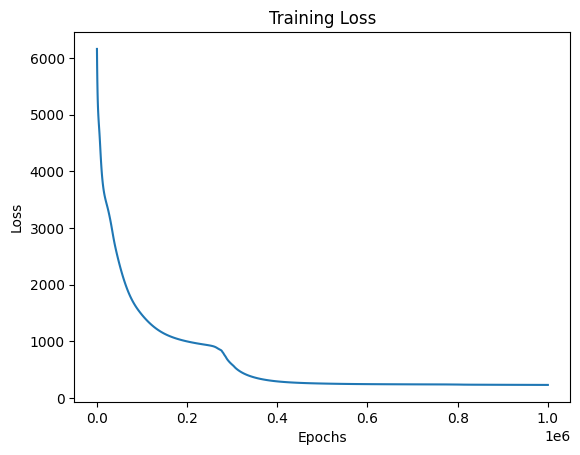

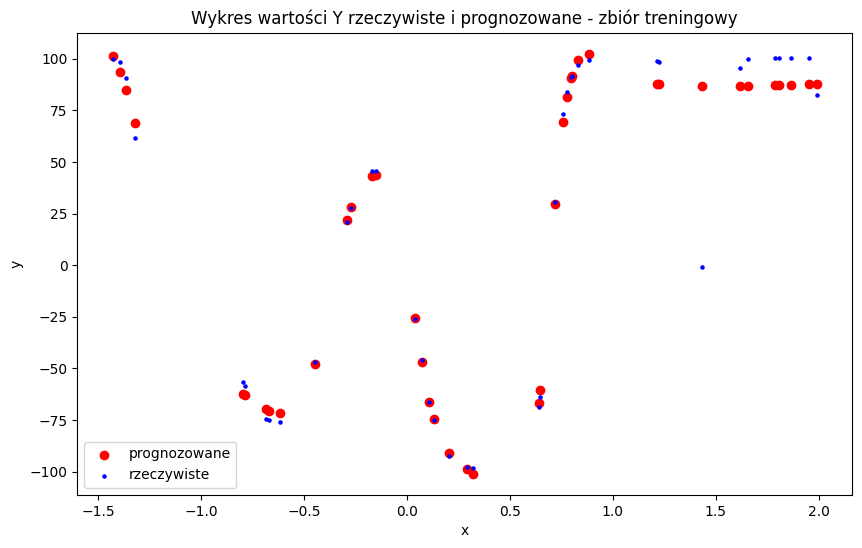

Train MSE =  229.3595144941152
 Test MSE =  529.3372170427039


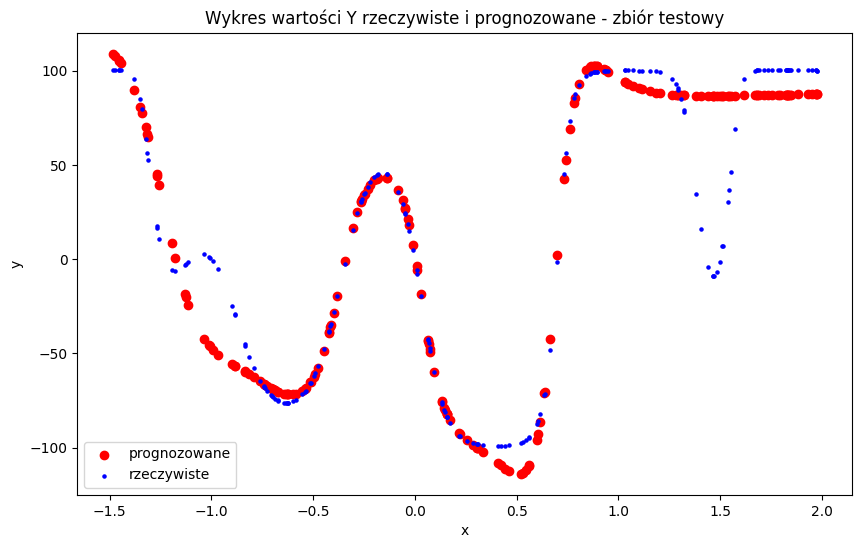

In [47]:
df = pd.read_csv('mio1/regression/multimodal-sparse-training.csv')
X=df.iloc[:,0].to_numpy().reshape(-1,1)
y_true=df.iloc[:,1].to_numpy().reshape(-1,1)

df = pd.read_csv('mio1/regression/multimodal-sparse-test.csv')
X_test=df.iloc[:,0].to_numpy().reshape(-1,1)
y_true_test=df.iloc[:,1].to_numpy().reshape(-1,1)
mlp = MLP( [1,64, 1] ,'tanh')

mlp.fit(X, y_true,500000, 0.000001, er=0, momentum=0, RMS=0,reg=1,lambda_reg=0.1,test_stop=0,patience=float('inf'), X_test=X_test, y_test=y_true_test, norm=0)

y_pred = mlp.predict(X,0)


mse_error = mlp.mse(y_true, y_pred)
plt.figure(figsize=(10, 6))
plt.scatter(X, y_pred, label='prognozowane', color='red')
plt.scatter(X, y_true, label='rzeczywiste', color='blue', s=5)
plt.title('Wykres wartości Y rzeczywiste i prognozowane - zbiór treningowy')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()
print("Train MSE = ", mse_error)

y_pred = mlp.predict(X_test,0)
mse_error = mlp.mse(y_true_test, y_pred)
print(" Test MSE = ", mse_error)
plt.figure(figsize=(10, 6))
plt.scatter(X_test, y_pred, label='prognozowane', color='red')
plt.scatter(X_test, y_true_test, label='rzeczywiste', color='blue', s=5)
plt.title('Wykres wartości Y rzeczywiste i prognozowane - zbiór testowy')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

#### regularyzacja L2 lambda=0.1

Epoch 1000/500000, Train Loss: 5196.0132922836765, Test Loss: 4478.531174516376
Epoch 2000/500000, Train Loss: 4863.975661221446, Test Loss: 4178.582130438221
Epoch 3000/500000, Train Loss: 4617.378068396317, Test Loss: 3969.503192294373
Epoch 4000/500000, Train Loss: 4323.034464945549, Test Loss: 3759.248534701676
Epoch 5000/500000, Train Loss: 4058.3151823735398, Test Loss: 3583.1800913433926
Epoch 6000/500000, Train Loss: 3861.1901234084726, Test Loss: 3454.9477511511127
Epoch 7000/500000, Train Loss: 3719.502672535019, Test Loss: 3363.7119861168844
Epoch 8000/500000, Train Loss: 3615.5892328578075, Test Loss: 3295.7449755538455
Epoch 9000/500000, Train Loss: 3536.300355791414, Test Loss: 3240.8815015900354
Epoch 10000/500000, Train Loss: 3470.0741901747474, Test Loss: 3191.109343360058
Epoch 11000/500000, Train Loss: 3409.0124922112955, Test Loss: 3141.3067601912935
Epoch 12000/500000, Train Loss: 3347.1172025588153, Test Loss: 3088.095675348329
Epoch 13000/500000, Train Loss: 3279

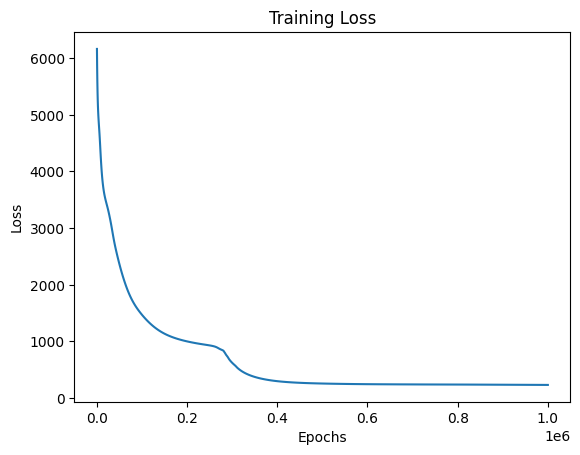

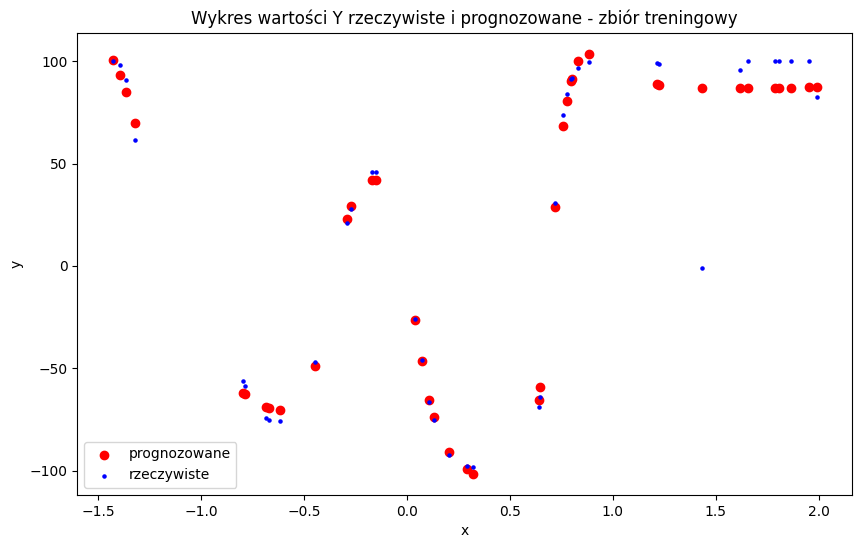

Train MSE =  233.44054608774633
 Test MSE =  526.5680631421984


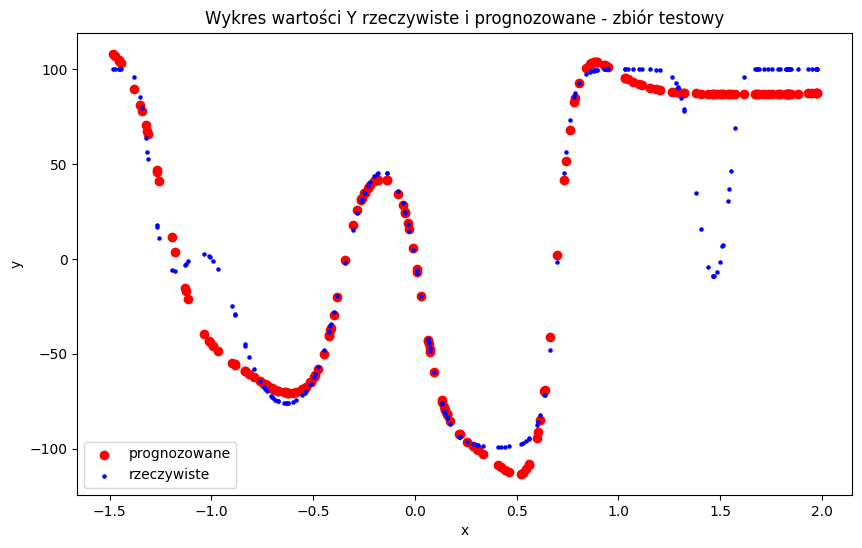

In [48]:
df = pd.read_csv('mio1/regression/multimodal-sparse-training.csv')
X=df.iloc[:,0].to_numpy().reshape(-1,1)
y_true=df.iloc[:,1].to_numpy().reshape(-1,1)

df = pd.read_csv('mio1/regression/multimodal-sparse-test.csv')
X_test=df.iloc[:,0].to_numpy().reshape(-1,1)
y_true_test=df.iloc[:,1].to_numpy().reshape(-1,1)
mlp = MLP( [1,64, 1] ,'tanh')

mlp.fit(X, y_true,500000, 0.000001, er=0, momentum=0, RMS=0,reg=2,lambda_reg=0.1,test_stop=0,patience=float('inf'), X_test=X_test, y_test=y_true_test, norm=0)

y_pred = mlp.predict(X,0)


mse_error = mlp.mse(y_true, y_pred)
plt.figure(figsize=(10, 6))
plt.scatter(X, y_pred, label='prognozowane', color='red')
plt.scatter(X, y_true, label='rzeczywiste', color='blue', s=5)
plt.title('Wykres wartości Y rzeczywiste i prognozowane - zbiór treningowy')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()
print("Train MSE = ", mse_error)

y_pred = mlp.predict(X_test,0)
mse_error = mlp.mse(y_true_test, y_pred)
print(" Test MSE = ", mse_error)
plt.figure(figsize=(10, 6))
plt.scatter(X_test, y_pred, label='prognozowane', color='red')
plt.scatter(X_test, y_true_test, label='rzeczywiste', color='blue', s=5)
plt.title('Wykres wartości Y rzeczywiste i prognozowane - zbiór testowy')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

#### regularyzacja L1 lambda=1

Epoch 1000/500000, Train Loss: 5196.9161962373455, Test Loss: 4479.350046919694
Epoch 2000/500000, Train Loss: 4864.628966890186, Test Loss: 4179.143806513666
Epoch 3000/500000, Train Loss: 4618.008050117691, Test Loss: 3969.995709930846
Epoch 4000/500000, Train Loss: 4324.081501263779, Test Loss: 3759.988213665949
Epoch 5000/500000, Train Loss: 4059.507306780186, Test Loss: 3583.9910469033466
Epoch 6000/500000, Train Loss: 3862.147166127225, Test Loss: 3455.617377639486
Epoch 7000/500000, Train Loss: 3719.904099377585, Test Loss: 3364.030138936276
Epoch 8000/500000, Train Loss: 3616.1956931387003, Test Loss: 3296.1410459283234
Epoch 9000/500000, Train Loss: 3537.304265920732, Test Loss: 3241.5407961520796
Epoch 10000/500000, Train Loss: 3471.366173271711, Test Loss: 3192.029725663244
Epoch 11000/500000, Train Loss: 3410.642221750861, Test Loss: 3142.5354782540335
Epoch 12000/500000, Train Loss: 3349.1508667376283, Test Loss: 3089.6548242587446
Epoch 13000/500000, Train Loss: 3282.3294

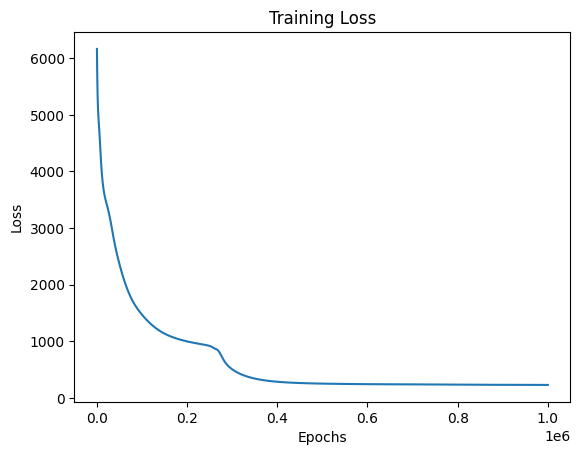

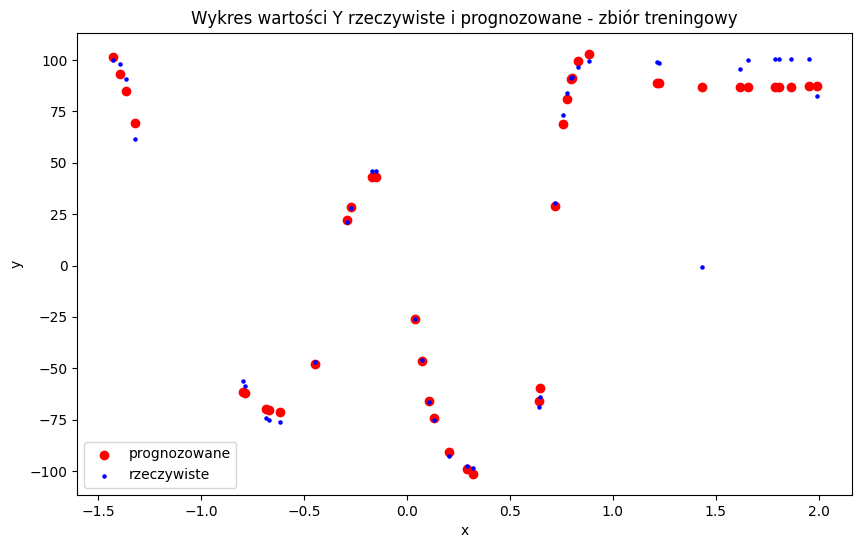

Train MSE =  231.52049191907477
 Test MSE =  518.1966954705033


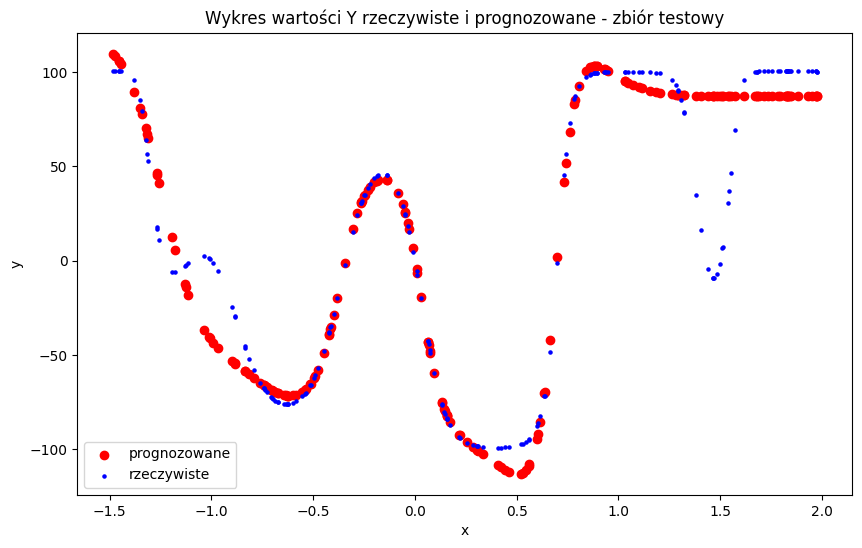

In [51]:
df = pd.read_csv('mio1/regression/multimodal-sparse-training.csv')
X=df.iloc[:,0].to_numpy().reshape(-1,1)
y_true=df.iloc[:,1].to_numpy().reshape(-1,1)

df = pd.read_csv('mio1/regression/multimodal-sparse-test.csv')
X_test=df.iloc[:,0].to_numpy().reshape(-1,1)
y_true_test=df.iloc[:,1].to_numpy().reshape(-1,1)
mlp = MLP( [1,64, 1] ,'tanh')

mlp.fit(X, y_true,500000, 0.000001, er=0, momentum=0, RMS=0,reg =1, lambda_reg=1,test_stop=0,patience=float('inf'), X_test=X_test, y_test=y_true_test, norm=0)

y_pred = mlp.predict(X,0)


mse_error = mlp.mse(y_true, y_pred)
plt.figure(figsize=(10, 6))
plt.scatter(X, y_pred, label='prognozowane', color='red')
plt.scatter(X, y_true, label='rzeczywiste', color='blue', s=5)
plt.title('Wykres wartości Y rzeczywiste i prognozowane - zbiór treningowy')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()
print("Train MSE = ", mse_error)

y_pred = mlp.predict(X_test,0)
mse_error = mlp.mse(y_true_test, y_pred)
print(" Test MSE = ", mse_error)
plt.figure(figsize=(10, 6))
plt.scatter(X_test, y_pred, label='prognozowane', color='red')
plt.scatter(X_test, y_true_test, label='rzeczywiste', color='blue', s=5)
plt.title('Wykres wartości Y rzeczywiste i prognozowane - zbiór testowy')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

#### regularyzacja L2 lambda=1

Epoch 1000/500000, Train Loss: 5196.743307089489, Test Loss: 4479.1790796472205
Epoch 2000/500000, Train Loss: 4864.921227727695, Test Loss: 4179.314624475398
Epoch 3000/500000, Train Loss: 4619.100761790687, Test Loss: 3970.8422003280243
Epoch 4000/500000, Train Loss: 4326.191338607399, Test Loss: 3761.688170166608
Epoch 5000/500000, Train Loss: 4062.442874702231, Test Loss: 3586.3009060786444
Epoch 6000/500000, Train Loss: 3865.617502520642, Test Loss: 3458.2115775345537
Epoch 7000/500000, Train Loss: 3723.805414570811, Test Loss: 3366.821531644255
Epoch 8000/500000, Train Loss: 3620.4359035936186, Test Loss: 3299.1517162869436
Epoch 9000/500000, Train Loss: 3542.026380100763, Test Loss: 3244.9914492941525
Epoch 10000/500000, Train Loss: 3476.854494948967, Test Loss: 3196.2569253618144
Epoch 11000/500000, Train Loss: 3417.2437337184374, Test Loss: 3147.9021943584007
Epoch 12000/500000, Train Loss: 3357.3449891048162, Test Loss: 3096.534107368777
Epoch 13000/500000, Train Loss: 3292.5

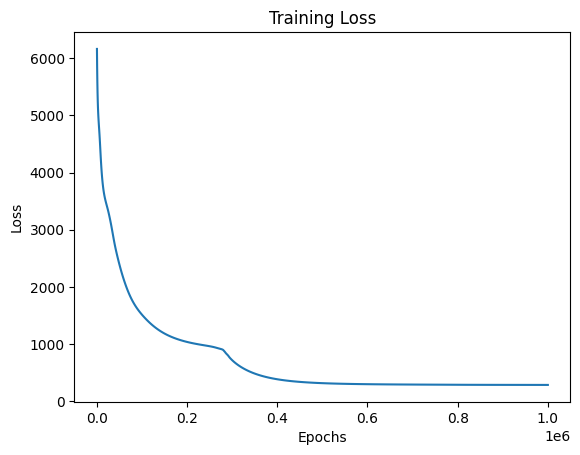

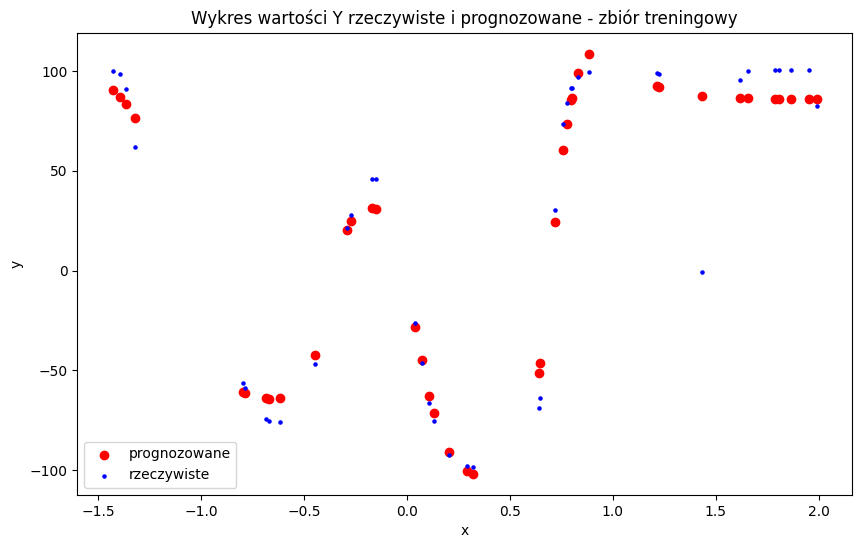

Train MSE =  286.5101006281696
 Test MSE =  570.561815498949


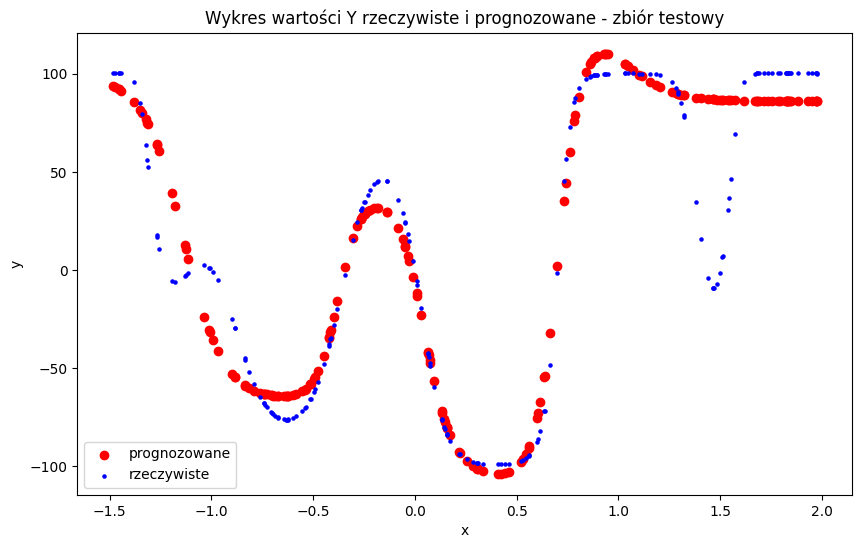

In [52]:
df = pd.read_csv('mio1/regression/multimodal-sparse-training.csv')
X=df.iloc[:,0].to_numpy().reshape(-1,1)
y_true=df.iloc[:,1].to_numpy().reshape(-1,1)

df = pd.read_csv('mio1/regression/multimodal-sparse-test.csv')
X_test=df.iloc[:,0].to_numpy().reshape(-1,1)
y_true_test=df.iloc[:,1].to_numpy().reshape(-1,1)
mlp = MLP( [1,64, 1] ,'tanh')

mlp.fit(X, y_true,500000, 0.000001, er=0, momentum=0, RMS=0,reg =2, lambda_reg=1,test_stop=0,patience=float('inf'), X_test=X_test, y_test=y_true_test, norm=0)

y_pred = mlp.predict(X,0)


mse_error = mlp.mse(y_true, y_pred)
plt.figure(figsize=(10, 6))
plt.scatter(X, y_pred, label='prognozowane', color='red')
plt.scatter(X, y_true, label='rzeczywiste', color='blue', s=5)
plt.title('Wykres wartości Y rzeczywiste i prognozowane - zbiór treningowy')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()
print("Train MSE = ", mse_error)

y_pred = mlp.predict(X_test,0)
mse_error = mlp.mse(y_true_test, y_pred)
print(" Test MSE = ", mse_error)
plt.figure(figsize=(10, 6))
plt.scatter(X_test, y_pred, label='prognozowane', color='red')
plt.scatter(X_test, y_true_test, label='rzeczywiste', color='blue', s=5)
plt.title('Wykres wartości Y rzeczywiste i prognozowane - zbiór testowy')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

#### zatrzymanie uczenia, jeżeli błąd na zbiorze testowym nie poprawi się w ciągu 1000 epok

Epoch 1000/500000, Train Loss: 5195.932273745289, Test Loss: 4478.459292920167
Epoch 2000/500000, Train Loss: 4863.871056232172, Test Loss: 4178.501334483256
Epoch 3000/500000, Train Loss: 4617.187220088633, Test Loss: 3969.3553061178
Epoch 4000/500000, Train Loss: 4322.684032926886, Test Loss: 3758.978291705145
Epoch 5000/500000, Train Loss: 4057.8565491103836, Test Loss: 3582.8340324979204
Epoch 6000/500000, Train Loss: 3860.6965866279397, Test Loss: 3454.5848708358444
Epoch 7000/500000, Train Loss: 3719.0263486237877, Test Loss: 3363.367810178951
Epoch 8000/500000, Train Loss: 3615.059656982465, Test Loss: 3295.371879846826
Epoch 9000/500000, Train Loss: 3535.669309963778, Test Loss: 3240.428395415968
Epoch 10000/500000, Train Loss: 3469.323538763053, Test Loss: 3190.539583957574
Epoch 11000/500000, Train Loss: 3408.101284866715, Test Loss: 3140.5769556554105
Epoch 12000/500000, Train Loss: 3345.9895164074615, Test Loss: 3087.1641415952063
Epoch 13000/500000, Train Loss: 3278.519797

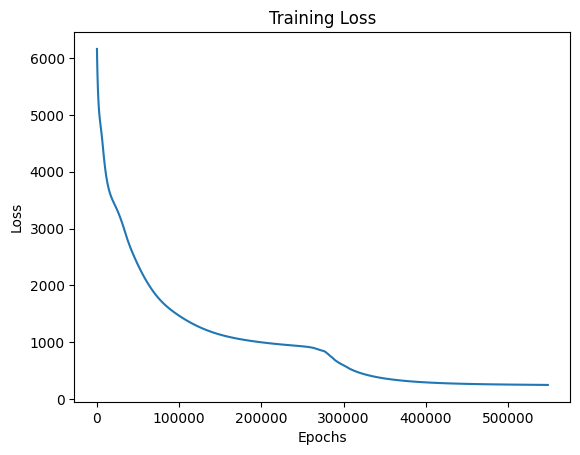

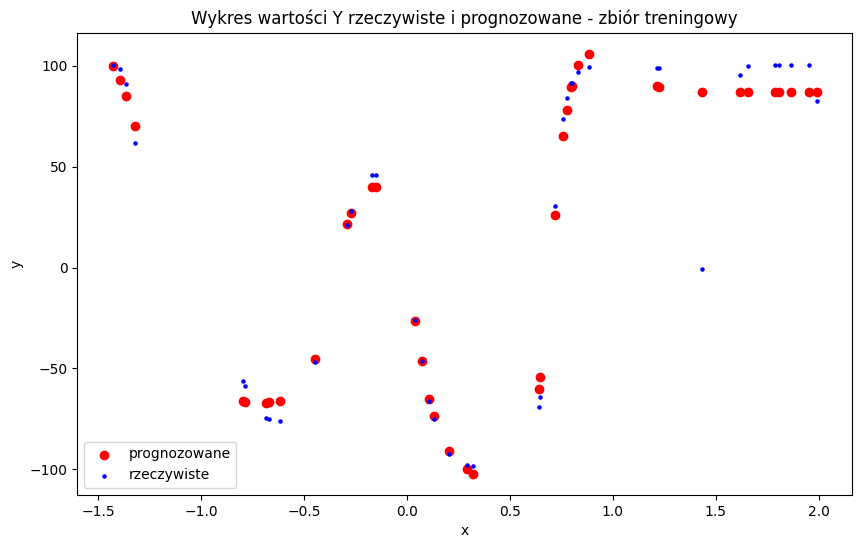

Train MSE =  247.16527688154306
 Test MSE =  563.0493316227594


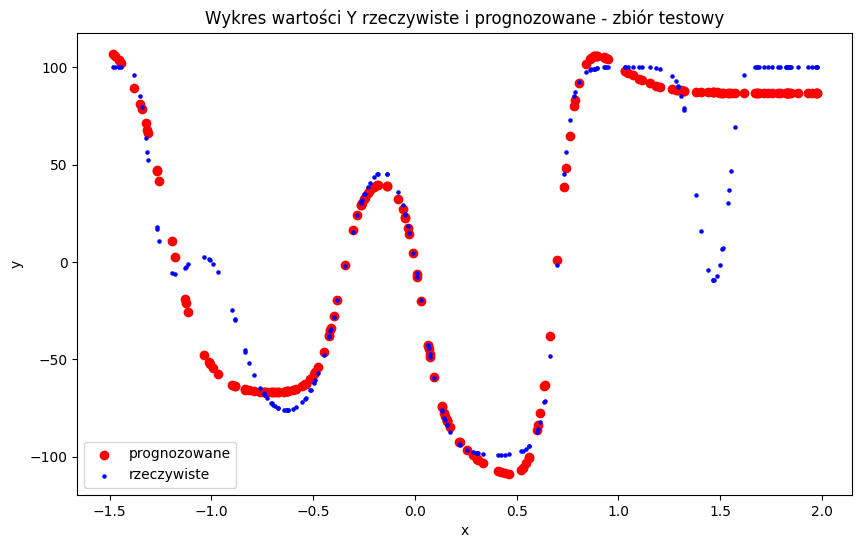

In [53]:
df = pd.read_csv('mio1/regression/multimodal-sparse-training.csv')
X=df.iloc[:,0].to_numpy().reshape(-1,1)
y_true=df.iloc[:,1].to_numpy().reshape(-1,1)

df = pd.read_csv('mio1/regression/multimodal-sparse-test.csv')
X_test=df.iloc[:,0].to_numpy().reshape(-1,1)
y_true_test=df.iloc[:,1].to_numpy().reshape(-1,1)
mlp = MLP( [1,64, 1] ,'tanh')

mlp.fit(X, y_true,500000, 0.000001, er=0, momentum=0, RMS=0,lambda_reg=0,test_stop=1,patience=1000, X_test=X_test, y_test=y_true_test, norm=0)

y_pred = mlp.predict(X,0)


mse_error = mlp.mse(y_true, y_pred)
plt.figure(figsize=(10, 6))
plt.scatter(X, y_pred, label='prognozowane', color='red')
plt.scatter(X, y_true, label='rzeczywiste', color='blue', s=5)
plt.title('Wykres wartości Y rzeczywiste i prognozowane - zbiór treningowy')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()
print("Train MSE = ", mse_error)

y_pred = mlp.predict(X_test,0)
mse_error = mlp.mse(y_true_test, y_pred)
print(" Test MSE = ", mse_error)
plt.figure(figsize=(10, 6))
plt.scatter(X_test, y_pred, label='prognozowane', color='red')
plt.scatter(X_test, y_true_test, label='rzeczywiste', color='blue', s=5)
plt.title('Wykres wartości Y rzeczywiste i prognozowane - zbiór testowy')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

## Zbiór rings5 regular

#### uczenie bez ulepszeń

Epoch 1000/50000, Train Loss: 0.4179686961957819, Test Loss: 0.3952782557901605
Epoch 2000/50000, Train Loss: 0.42685351206577876, Test Loss: 0.39918738419053124
Epoch 3000/50000, Train Loss: 0.4279960694781314, Test Loss: 0.4015448473950971
Epoch 4000/50000, Train Loss: 0.4389861944614073, Test Loss: 0.40910203080080726
Epoch 5000/50000, Train Loss: 0.446325629544407, Test Loss: 0.41313949585383164
Epoch 6000/50000, Train Loss: 0.4563175784989033, Test Loss: 0.42494904785472476
Epoch 7000/50000, Train Loss: 0.4716223559144187, Test Loss: 0.43844377612411556
Epoch 8000/50000, Train Loss: 0.485148079587023, Test Loss: 0.448549406244242
Epoch 9000/50000, Train Loss: 0.49866352850158846, Test Loss: 0.46378651395222625
Epoch 10000/50000, Train Loss: 0.5143108502883512, Test Loss: 0.4788245447607292
Epoch 11000/50000, Train Loss: 0.5257908432840607, Test Loss: 0.49017803612052424
Epoch 12000/50000, Train Loss: 0.5460474882536758, Test Loss: 0.4968012442361003
Epoch 13000/50000, Train Loss: 

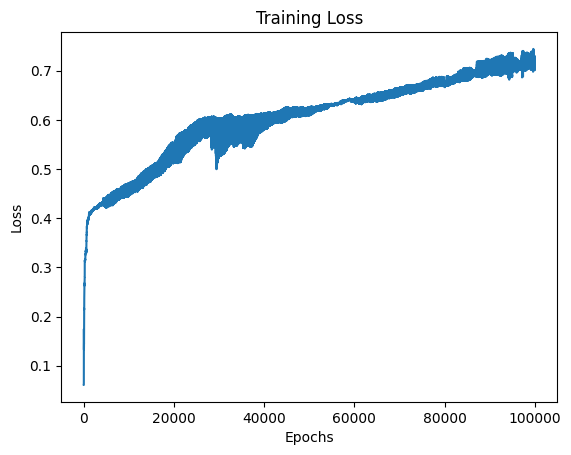

Train F-measure:  0.7210494469724026
Test F-measure:  0.5851927271068447


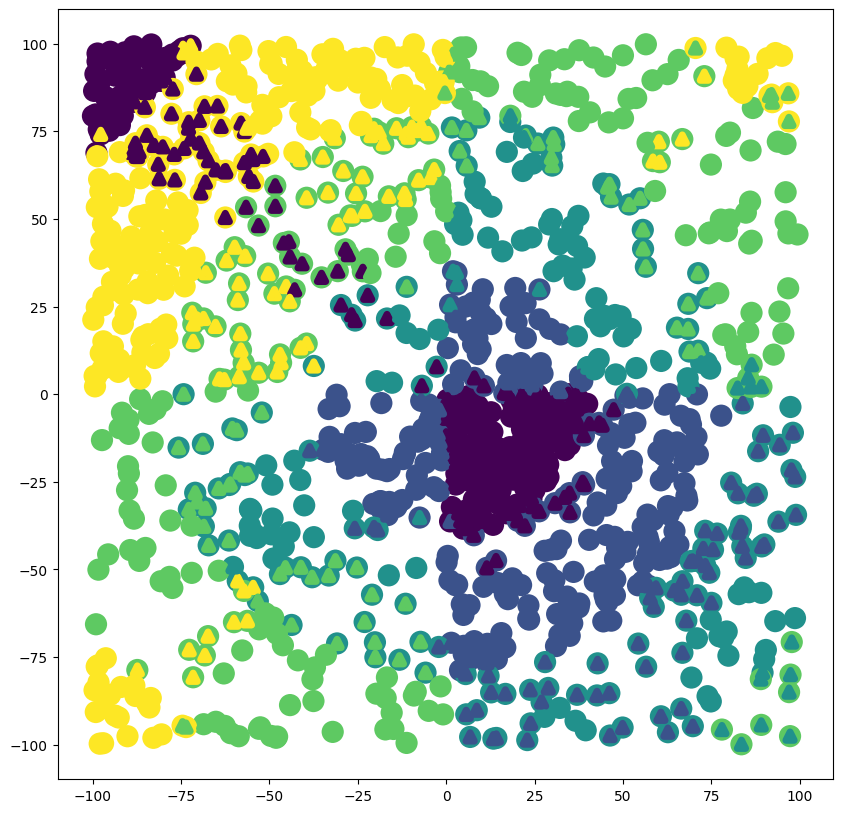

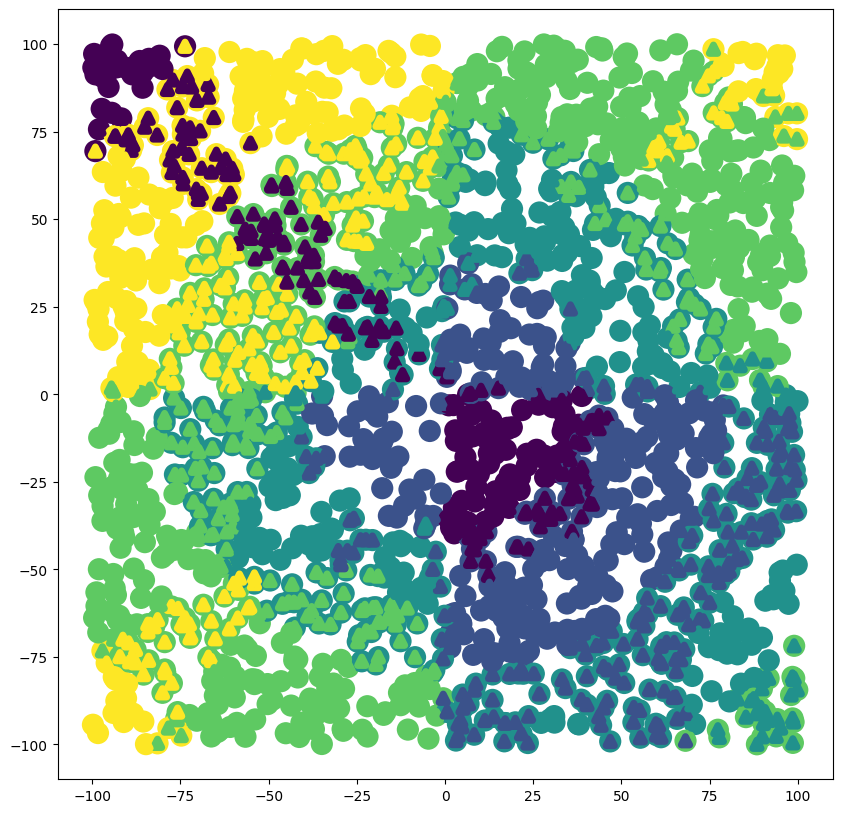

In [5]:
df = pd.read_csv('mio1/classification/rings5-regular-training.csv')
X = df.iloc[:, :-1].to_numpy()
y = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_true = one_hot_encode(y, 5)

df = pd.read_csv('mio1/classification/rings5-regular-test.csv')
X_test = df.iloc[:, :-1].to_numpy()
y_test = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_true_test = one_hot_encode(y_test, 5)

mlp = MLP([2,32,16,8, 5], 'relu', 'softmax', "cross-entropy")

mlp.fit(X, y_true,50000, 0.000001, er=1, momentum=0, RMS=0,reg=0,lambda_reg=0,test_stop=0,patience=float('inf'), X_test=X_test, y_test=y_true_test, norm=0)


y_prob = mlp.predict(X,0)
y_pred =mlp.softmax_to_one_hot(y_prob)
y_pred_col = mlp.convert_to_class_indices(y_pred)
F = mlp.f1_score(y_pred=y_pred, y_true=y_true)
print("Train F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=4)
plt.scatter(X[:, 0], X[:, 1], c=y_pred_col, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=4)



y_prob_test = mlp.predict(X_test,0)
y_pred_test = mlp.softmax_to_one_hot(y_prob_test)
y_pred_col_test = mlp.convert_to_class_indices(y_pred_test)
F = mlp.f1_score(y_pred=y_pred_test, y_true=y_true_test)
print("Test F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=4)
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_pred_col_test, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=4)

#### regularyzacja L1 lambda=0.1

Epoch 1000/50000, Train Loss: 0.4173496600941425, Test Loss: 0.395611716705898
Epoch 2000/50000, Train Loss: 0.42685351206577876, Test Loss: 0.39944795531249755
Epoch 3000/50000, Train Loss: 0.4268294384839336, Test Loss: 0.40197386822948483
Epoch 4000/50000, Train Loss: 0.4413182020921232, Test Loss: 0.4088775847244618
Epoch 5000/50000, Train Loss: 0.4463676389281598, Test Loss: 0.413062221832236
Epoch 6000/50000, Train Loss: 0.45706108526406536, Test Loss: 0.42444131175922184
Epoch 7000/50000, Train Loss: 0.47116860654509446, Test Loss: 0.43636666395511403
Epoch 8000/50000, Train Loss: 0.48447331096815827, Test Loss: 0.45010459619392174
Epoch 9000/50000, Train Loss: 0.5005637677626927, Test Loss: 0.46413606289884574
Epoch 10000/50000, Train Loss: 0.5124069258482803, Test Loss: 0.47920856307227105
Epoch 11000/50000, Train Loss: 0.5273410908105347, Test Loss: 0.49101616340090165
Epoch 12000/50000, Train Loss: 0.5440993370754854, Test Loss: 0.4962555512708982
Epoch 13000/50000, Train Lo

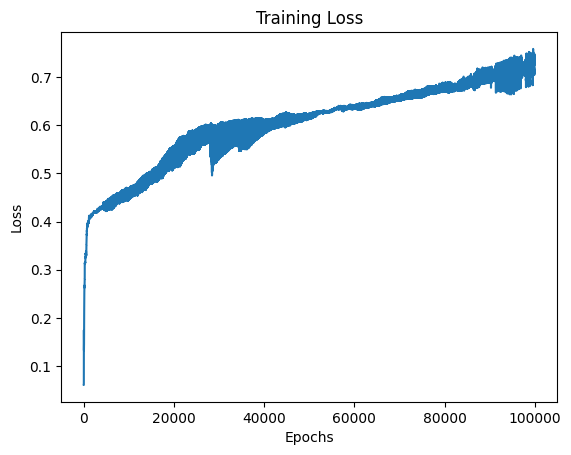

Train F-measure:  0.7304758357847179
Test F-measure:  0.6046116268419967


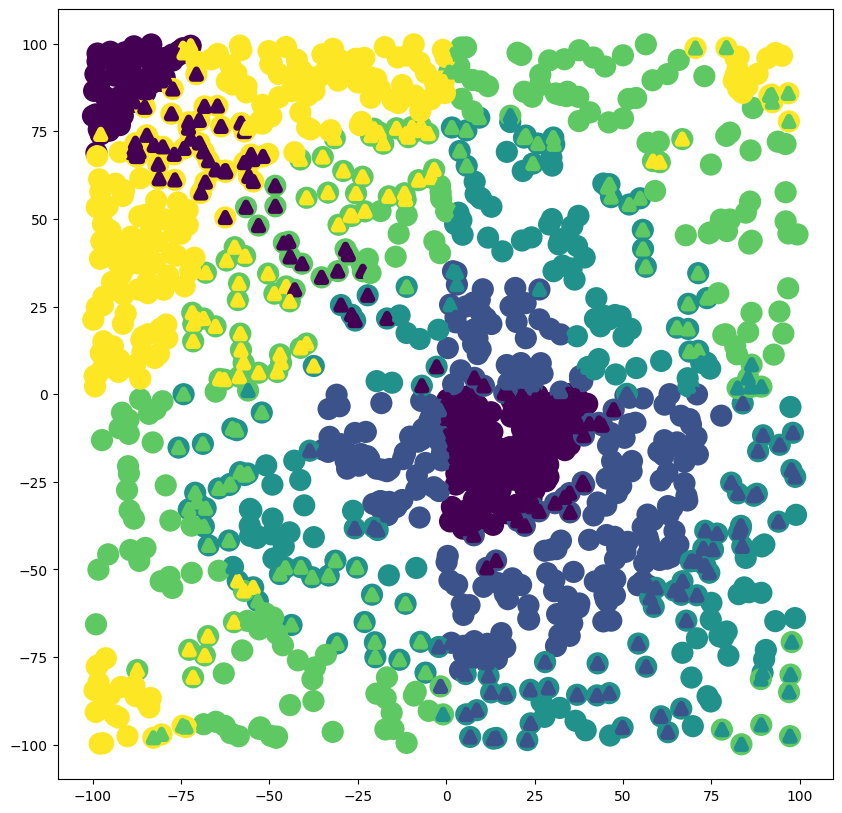

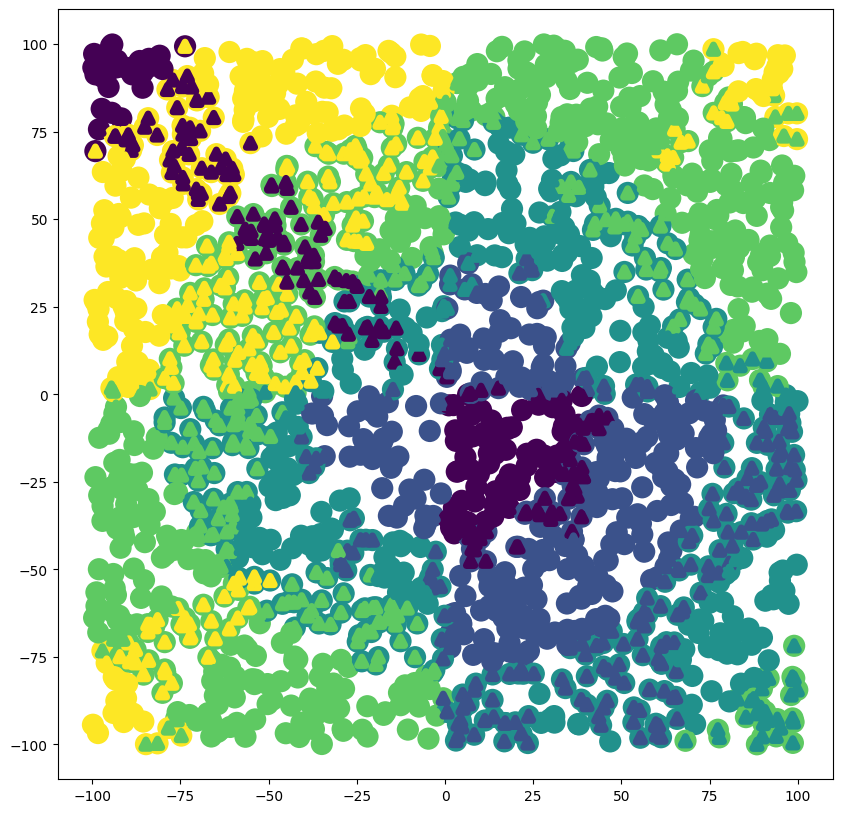

In [8]:
df = pd.read_csv('mio1/classification/rings5-regular-training.csv')
X = df.iloc[:, :-1].to_numpy()
y = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_true = one_hot_encode(y, 5)

df = pd.read_csv('mio1/classification/rings5-regular-test.csv')
X_test = df.iloc[:, :-1].to_numpy()
y_test = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_true_test = one_hot_encode(y_test, 5)

mlp = MLP([2,32,16,8, 5], 'relu', 'softmax', "cross-entropy")

mlp.fit(X, y_true,50000, 0.000001, er=1, momentum=0, RMS=0,reg=1,lambda_reg=0.1,test_stop=0,patience=float('inf'), X_test=X_test, y_test=y_true_test, norm=0)


y_prob = mlp.predict(X,0)
y_pred =mlp.softmax_to_one_hot(y_prob)
y_pred_col = mlp.convert_to_class_indices(y_pred)
F = mlp.f1_score(y_pred=y_pred, y_true=y_true)
print("Train F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=4)
plt.scatter(X[:, 0], X[:, 1], c=y_pred_col, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=4)



y_prob_test = mlp.predict(X_test,0)
y_pred_test = mlp.softmax_to_one_hot(y_prob_test)
y_pred_col_test = mlp.convert_to_class_indices(y_pred_test)
F = mlp.f1_score(y_pred=y_pred_test, y_true=y_true_test)
print("Test F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=4)
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_pred_col_test, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=4)

#### regularyzacja L2 lambda=0.1

Epoch 1000/50000, Train Loss: 0.4179686961957819, Test Loss: 0.39534590490952726
Epoch 2000/50000, Train Loss: 0.42977440034502495, Test Loss: 0.4011428220288299
Epoch 3000/50000, Train Loss: 0.4491129444179588, Test Loss: 0.4080375349800958
Epoch 4000/50000, Train Loss: 0.45848133827754867, Test Loss: 0.4148674573040311
Epoch 5000/50000, Train Loss: 0.4692301022337923, Test Loss: 0.4170540094974876
Epoch 6000/50000, Train Loss: 0.4810559010950225, Test Loss: 0.4202329256769454
Epoch 7000/50000, Train Loss: 0.49936645087669973, Test Loss: 0.43214977435485447
Epoch 8000/50000, Train Loss: 0.513181607217245, Test Loss: 0.44688497136669836
Epoch 9000/50000, Train Loss: 0.5335694110182251, Test Loss: 0.45014907163926726
Epoch 10000/50000, Train Loss: 0.5540297140189319, Test Loss: 0.4656615583613027
Epoch 11000/50000, Train Loss: 0.5765817101388391, Test Loss: 0.47993625044436294
Epoch 12000/50000, Train Loss: 0.5885691069622417, Test Loss: 0.4906697274151739
Epoch 13000/50000, Train Loss:

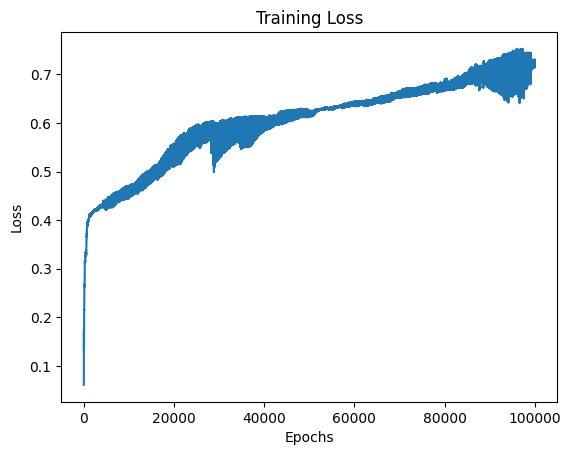

Train F-measure:  0.7283148609280726
Test F-measure:  0.6577982769530906


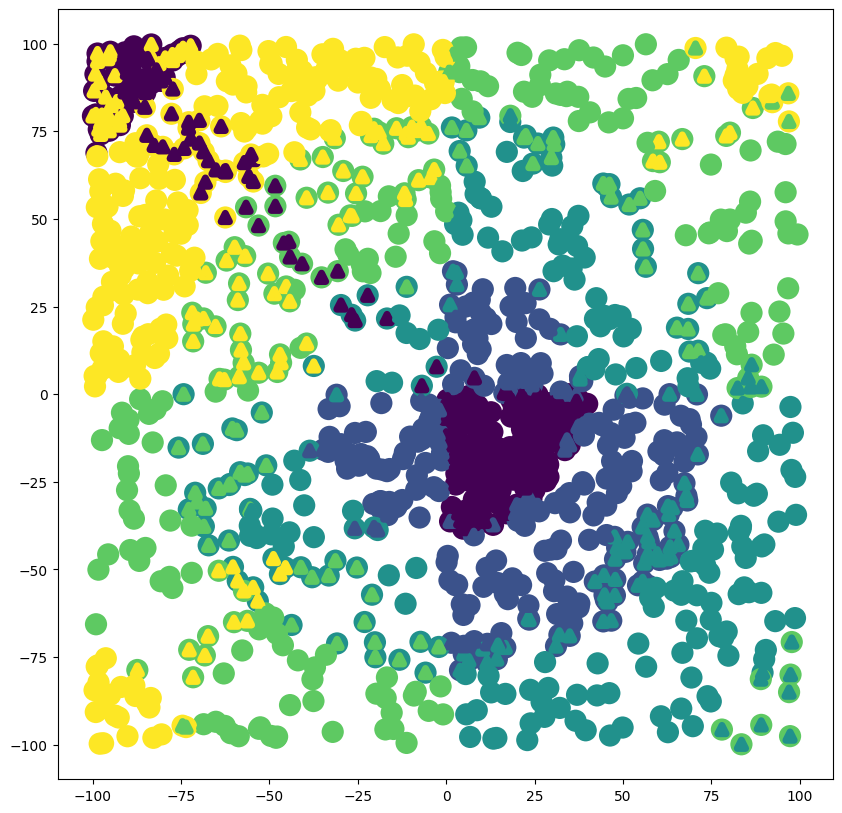

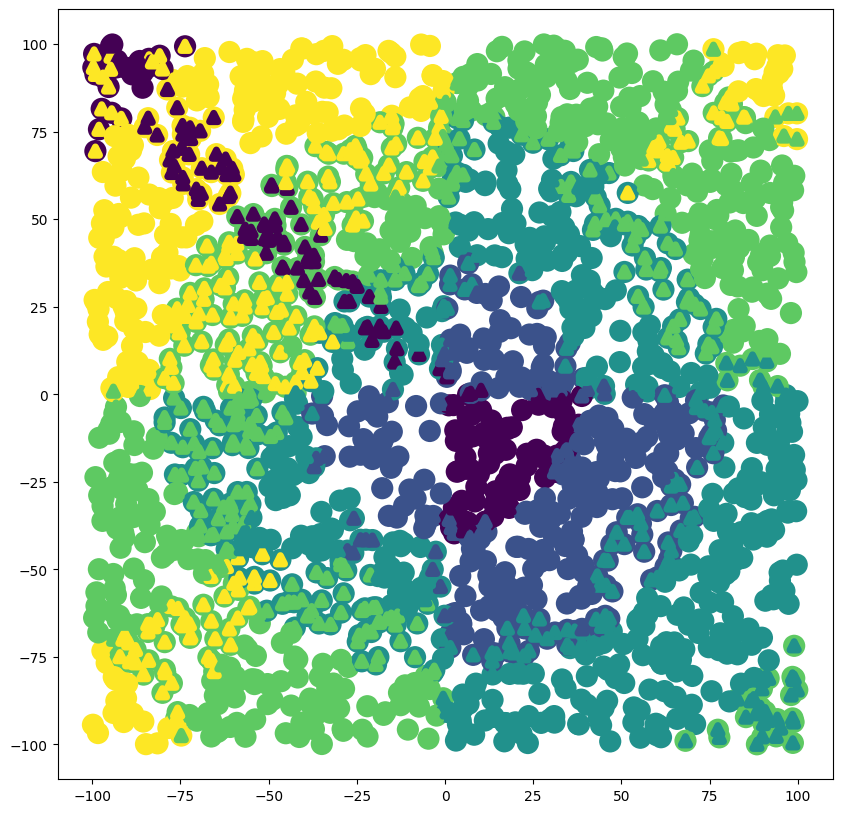

In [9]:
df = pd.read_csv('mio1/classification/rings5-regular-training.csv')
X = df.iloc[:, :-1].to_numpy()
y = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_true = one_hot_encode(y, 5)

df = pd.read_csv('mio1/classification/rings5-regular-test.csv')
X_test = df.iloc[:, :-1].to_numpy()
y_test = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_true_test = one_hot_encode(y_test, 5)

mlp = MLP([2,32,16,8, 5], 'relu', 'softmax', "cross-entropy")

mlp.fit(X, y_true,50000, 0.000001, er=1, momentum=0, RMS=0,reg=2,lambda_reg=0.1,test_stop=0,patience=float('inf'), X_test=X_test, y_test=y_true_test, norm=0)


y_prob = mlp.predict(X,0)
y_pred =mlp.softmax_to_one_hot(y_prob)
y_pred_col = mlp.convert_to_class_indices(y_pred)
F = mlp.f1_score(y_pred=y_pred, y_true=y_true)
print("Train F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=4)
plt.scatter(X[:, 0], X[:, 1], c=y_pred_col, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=4)



y_prob_test = mlp.predict(X_test,0)
y_pred_test = mlp.softmax_to_one_hot(y_prob_test)
y_pred_col_test = mlp.convert_to_class_indices(y_pred_test)
F = mlp.f1_score(y_pred=y_pred_test, y_true=y_true_test)
print("Test F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=4)
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_pred_col_test, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=4)

#### regularyzacja L1 lambda=1

Epoch 1000/50000, Train Loss: 0.4173496600941425, Test Loss: 0.3960818970507093
Epoch 2000/50000, Train Loss: 0.4249289468554102, Test Loss: 0.3974190530294216
Epoch 3000/50000, Train Loss: 0.42815168403811565, Test Loss: 0.40011203147704705
Epoch 4000/50000, Train Loss: 0.435512818181817, Test Loss: 0.4072459079814347
Epoch 5000/50000, Train Loss: 0.4509674622774276, Test Loss: 0.4130827352712935
Epoch 6000/50000, Train Loss: 0.46271434734641276, Test Loss: 0.4235649114445975
Epoch 7000/50000, Train Loss: 0.4717354933590139, Test Loss: 0.43640700075935807
Epoch 8000/50000, Train Loss: 0.4840458156405312, Test Loss: 0.4473414652186968
Epoch 9000/50000, Train Loss: 0.5046575739745967, Test Loss: 0.46542195299840017
Epoch 10000/50000, Train Loss: 0.5105675550320272, Test Loss: 0.47705699515150746
Epoch 11000/50000, Train Loss: 0.5269700766515255, Test Loss: 0.48644770759832634
Epoch 12000/50000, Train Loss: 0.5528900584058215, Test Loss: 0.5007556445573178
Epoch 13000/50000, Train Loss: 

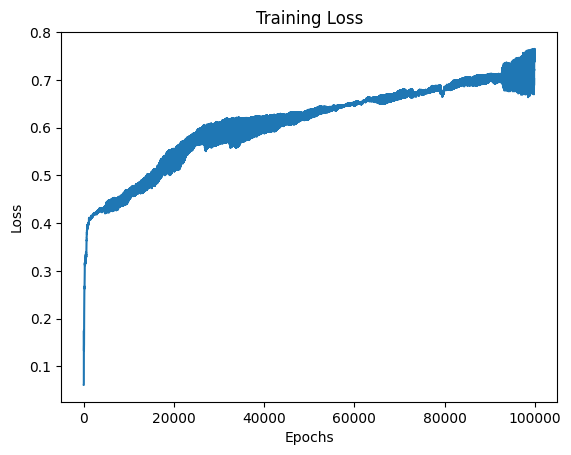

Train F-measure:  0.7387340312807493
Test F-measure:  0.6039456780775291


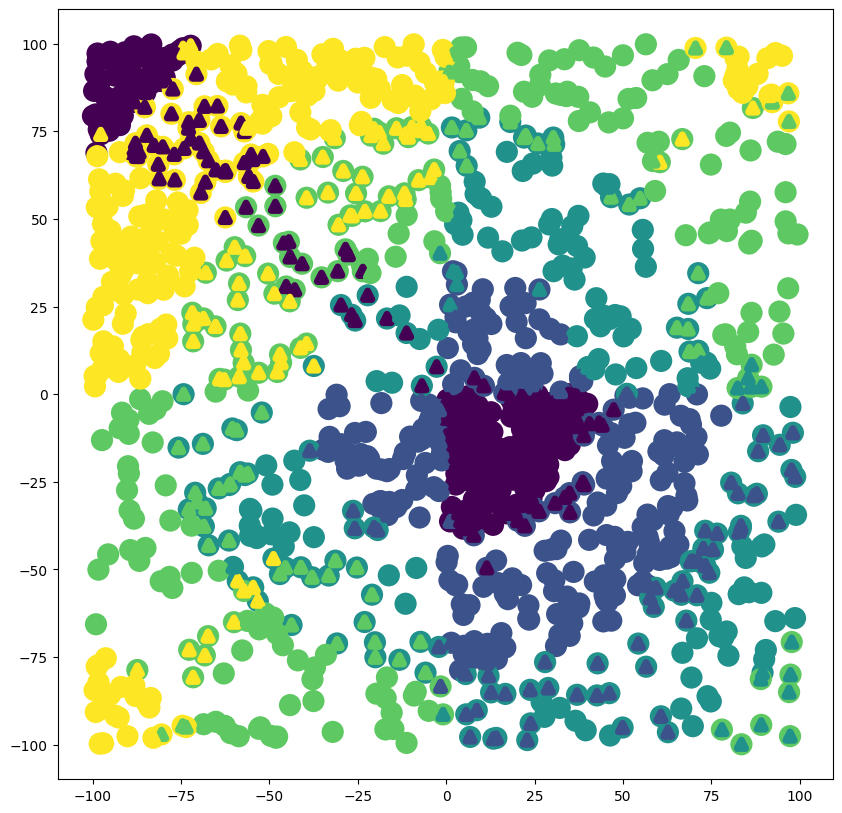

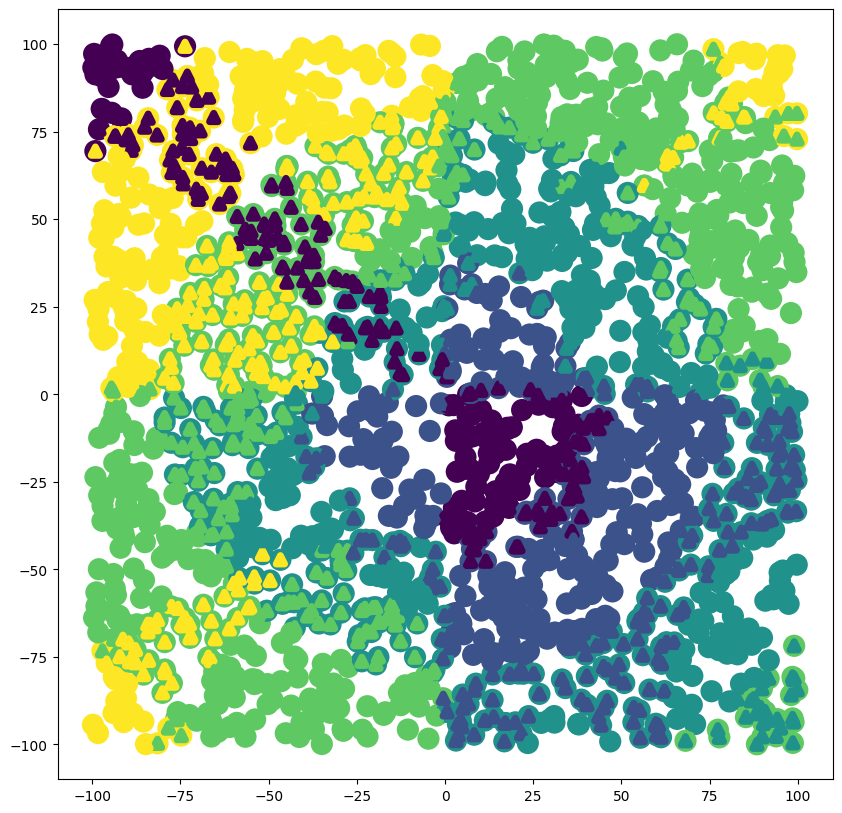

In [10]:
df = pd.read_csv('mio1/classification/rings5-regular-training.csv')
X = df.iloc[:, :-1].to_numpy()
y = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_true = one_hot_encode(y, 5)

df = pd.read_csv('mio1/classification/rings5-regular-test.csv')
X_test = df.iloc[:, :-1].to_numpy()
y_test = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_true_test = one_hot_encode(y_test, 5)

mlp = MLP([2,32,16,8, 5], 'relu', 'softmax', "cross-entropy")

mlp.fit(X, y_true,50000, 0.000001, er=1, momentum=0, RMS=0,reg=1,lambda_reg=1,test_stop=0,patience=float('inf'), X_test=X_test, y_test=y_true_test, norm=0)


y_prob = mlp.predict(X,0)
y_pred =mlp.softmax_to_one_hot(y_prob)
y_pred_col = mlp.convert_to_class_indices(y_pred)
F = mlp.f1_score(y_pred=y_pred, y_true=y_true)
print("Train F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=4)
plt.scatter(X[:, 0], X[:, 1], c=y_pred_col, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=4)



y_prob_test = mlp.predict(X_test,0)
y_pred_test = mlp.softmax_to_one_hot(y_prob_test)
y_pred_col_test = mlp.convert_to_class_indices(y_pred_test)
F = mlp.f1_score(y_pred=y_pred_test, y_true=y_true_test)
print("Test F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=4)
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_pred_col_test, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=4)

#### regularyzacja L2 lambda=1

Epoch 1000/50000, Train Loss: 0.4167278465306719, Test Loss: 0.3952782557901605
Epoch 2000/50000, Train Loss: 0.42909375586534154, Test Loss: 0.39944141612671075
Epoch 3000/50000, Train Loss: 0.44985925254725745, Test Loss: 0.40776321792676085
Epoch 4000/50000, Train Loss: 0.4582046262144037, Test Loss: 0.41219696117880966
Epoch 5000/50000, Train Loss: 0.46764718379150205, Test Loss: 0.4164918410796929
Epoch 6000/50000, Train Loss: 0.48267757687993545, Test Loss: 0.42112420378709203
Epoch 7000/50000, Train Loss: 0.4993069860795224, Test Loss: 0.4345930958661645
Epoch 8000/50000, Train Loss: 0.5103335554332428, Test Loss: 0.44584666288865255
Epoch 9000/50000, Train Loss: 0.535158562556859, Test Loss: 0.4523308606331759
Epoch 10000/50000, Train Loss: 0.5583394701143971, Test Loss: 0.47026444762836944
Epoch 11000/50000, Train Loss: 0.5766642364254936, Test Loss: 0.48352093497418897
Epoch 12000/50000, Train Loss: 0.5851041518484917, Test Loss: 0.4911224194284107
Epoch 13000/50000, Train Lo

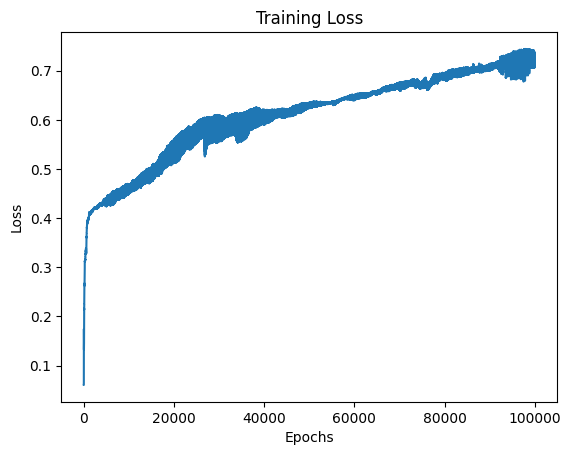

Train F-measure:  0.7395285605723229
Test F-measure:  0.6709635710268909


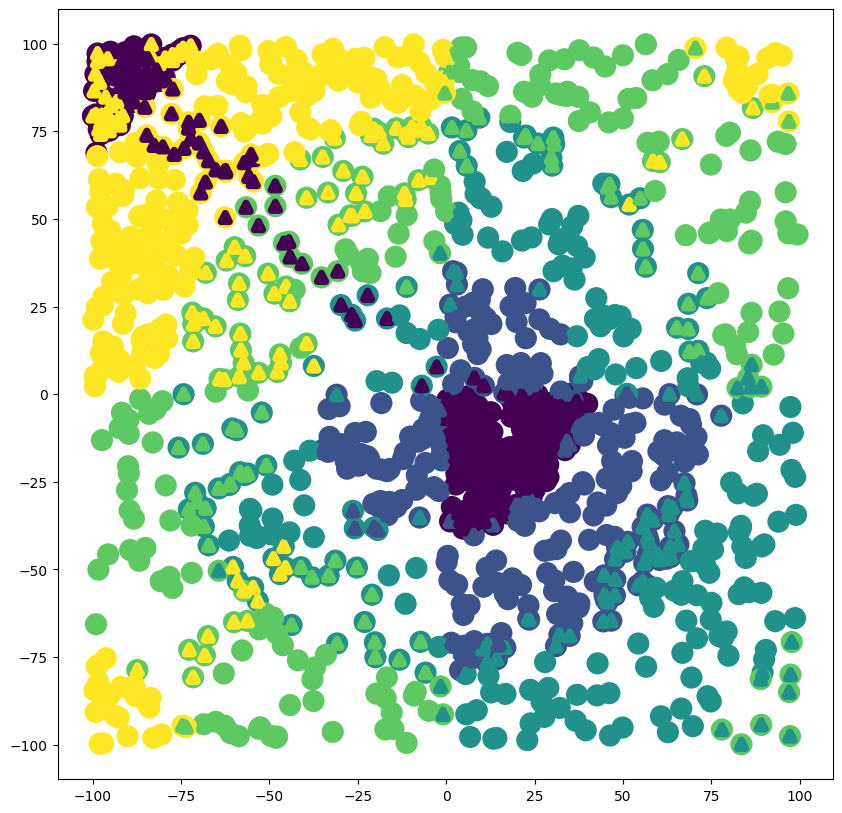

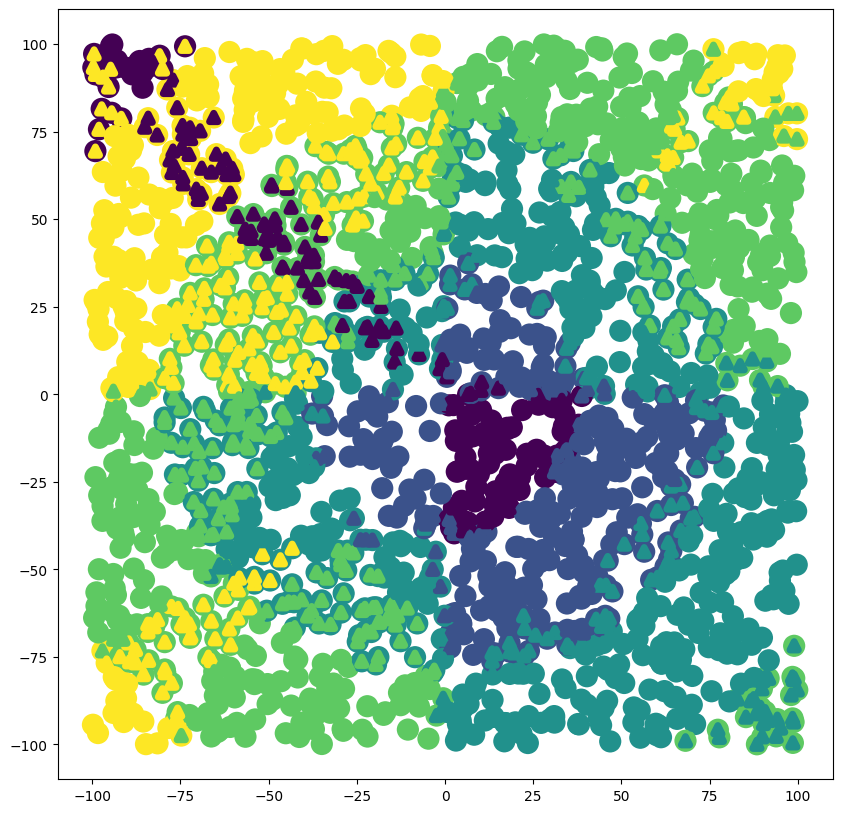

In [11]:
df = pd.read_csv('mio1/classification/rings5-regular-training.csv')
X = df.iloc[:, :-1].to_numpy()
y = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_true = one_hot_encode(y, 5)

df = pd.read_csv('mio1/classification/rings5-regular-test.csv')
X_test = df.iloc[:, :-1].to_numpy()
y_test = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_true_test = one_hot_encode(y_test, 5)

mlp = MLP([2,32,16,8, 5], 'relu', 'softmax', "cross-entropy")

mlp.fit(X, y_true,50000, 0.000001, er=1, momentum=0, RMS=0,reg=2,lambda_reg=1,test_stop=0,patience=float('inf'), X_test=X_test, y_test=y_true_test, norm=0)


y_prob = mlp.predict(X,0)
y_pred =mlp.softmax_to_one_hot(y_prob)
y_pred_col = mlp.convert_to_class_indices(y_pred)
F = mlp.f1_score(y_pred=y_pred, y_true=y_true)
print("Train F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=4)
plt.scatter(X[:, 0], X[:, 1], c=y_pred_col, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=4)



y_prob_test = mlp.predict(X_test,0)
y_pred_test = mlp.softmax_to_one_hot(y_prob_test)
y_pred_col_test = mlp.convert_to_class_indices(y_pred_test)
F = mlp.f1_score(y_pred=y_pred_test, y_true=y_true_test)
print("Test F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=4)
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_pred_col_test, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=4)

#### zatrzymanie uczenia, jeżeli błąd na zbiorze testowym nie poprawi się w ciągu 1000 epok

Epoch 1000/50000, Train Loss: 0.4179686961957819, Test Loss: 0.3952782557901605
Epoch 2000/50000, Train Loss: 0.42685351206577876, Test Loss: 0.39918738419053124
Epoch 3000/50000, Train Loss: 0.4279960694781314, Test Loss: 0.4015448473950971
Epoch 4000/50000, Train Loss: 0.4389861944614073, Test Loss: 0.40910203080080726
Epoch 5000/50000, Train Loss: 0.446325629544407, Test Loss: 0.41313949585383164
Epoch 6000/50000, Train Loss: 0.4563175784989033, Test Loss: 0.42494904785472476
Epoch 7000/50000, Train Loss: 0.4716223559144187, Test Loss: 0.43844377612411556
Epoch 8000/50000, Train Loss: 0.485148079587023, Test Loss: 0.448549406244242
Epoch 9000/50000, Train Loss: 0.49866352850158846, Test Loss: 0.46378651395222625
Epoch 10000/50000, Train Loss: 0.5143108502883512, Test Loss: 0.4788245447607292
Epoch 11000/50000, Train Loss: 0.5257908432840607, Test Loss: 0.49017803612052424
Epoch 12000/50000, Train Loss: 0.5460474882536758, Test Loss: 0.4968012442361003
Early stopping on epoch 12394: 

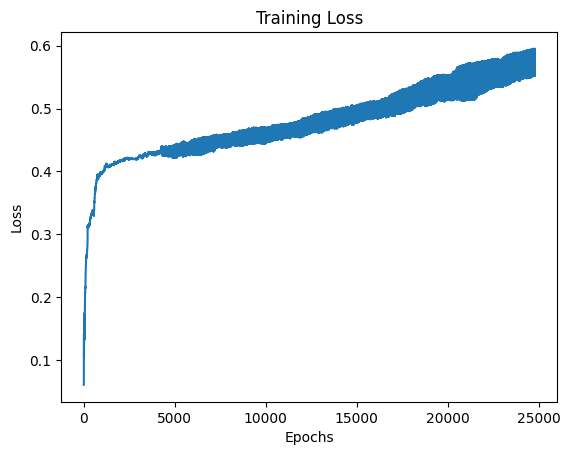

Train F-measure:  0.5947752431693363
Test F-measure:  0.49884110524446373


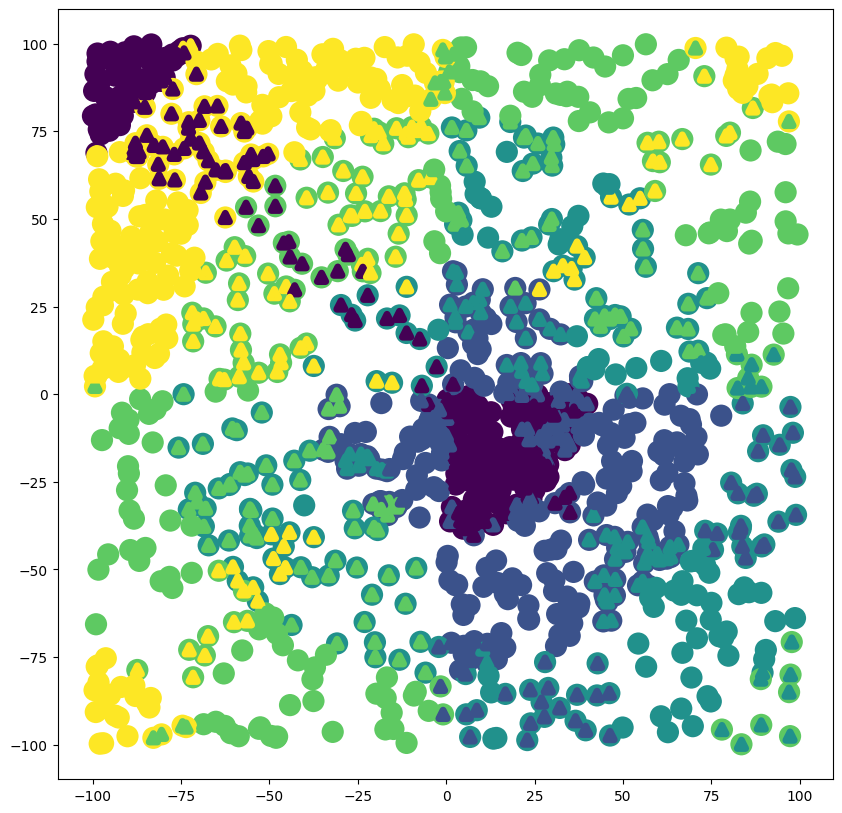

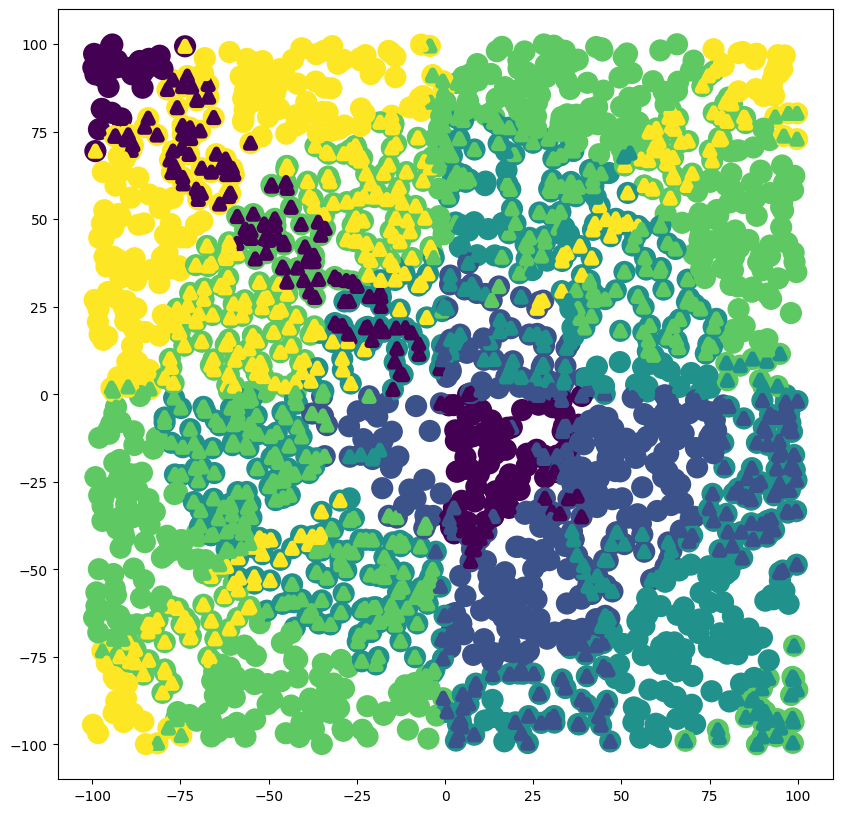

In [12]:
df = pd.read_csv('mio1/classification/rings5-regular-training.csv')
X = df.iloc[:, :-1].to_numpy()
y = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_true = one_hot_encode(y, 5)

df = pd.read_csv('mio1/classification/rings5-regular-test.csv')
X_test = df.iloc[:, :-1].to_numpy()
y_test = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_true_test = one_hot_encode(y_test, 5)

mlp = MLP([2,32,16,8, 5], 'relu', 'softmax', "cross-entropy")

mlp.fit(X, y_true,50000, 0.000001, er=1, momentum=0, RMS=0,reg=0,lambda_reg=0,test_stop=1,patience=1000, X_test=X_test, y_test=y_true_test, norm=0)


y_prob = mlp.predict(X,0)
y_pred =mlp.softmax_to_one_hot(y_prob)
y_pred_col = mlp.convert_to_class_indices(y_pred)
F = mlp.f1_score(y_pred=y_pred, y_true=y_true)
print("Train F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=4)
plt.scatter(X[:, 0], X[:, 1], c=y_pred_col, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=4)



y_prob_test = mlp.predict(X_test,0)
y_pred_test = mlp.softmax_to_one_hot(y_prob_test)
y_pred_col_test = mlp.convert_to_class_indices(y_pred_test)
F = mlp.f1_score(y_pred=y_pred_test, y_true=y_true_test)
print("Test F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=4)
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_pred_col_test, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=4)

## Zbiór rings3 balance

#### uczenie bez ulepszeń

Epoch 1000/50000, Train Loss: 0.3968167574518535, Test Loss: 0.3111252909277061
Epoch 2000/50000, Train Loss: 0.43401724571322614, Test Loss: 0.3375548266369801
Epoch 3000/50000, Train Loss: 0.43420658970005427, Test Loss: 0.3388046857617833
Epoch 4000/50000, Train Loss: 0.4302411055157181, Test Loss: 0.3347983578213212
Epoch 5000/50000, Train Loss: 0.4318969803193813, Test Loss: 0.33154058268533526
Epoch 6000/50000, Train Loss: 0.4396121152357635, Test Loss: 0.33307792371957184
Epoch 7000/50000, Train Loss: 0.4472859109084449, Test Loss: 0.33842949938421735
Epoch 8000/50000, Train Loss: 0.45604781666060973, Test Loss: 0.34352028113903715
Epoch 9000/50000, Train Loss: 0.4661348419638922, Test Loss: 0.35064095362323267
Epoch 10000/50000, Train Loss: 0.4716895268858523, Test Loss: 0.3554021206210309
Epoch 11000/50000, Train Loss: 0.47845291840136034, Test Loss: 0.3590389706837409
Epoch 12000/50000, Train Loss: 0.4885775920487314, Test Loss: 0.36474550146616513
Epoch 13000/50000, Train Lo

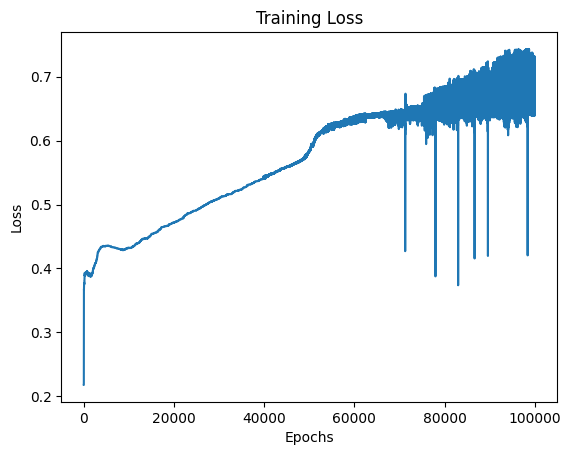

Train F-measure:  0.7316210065787145
Test F-measure:  0.5809986623497859


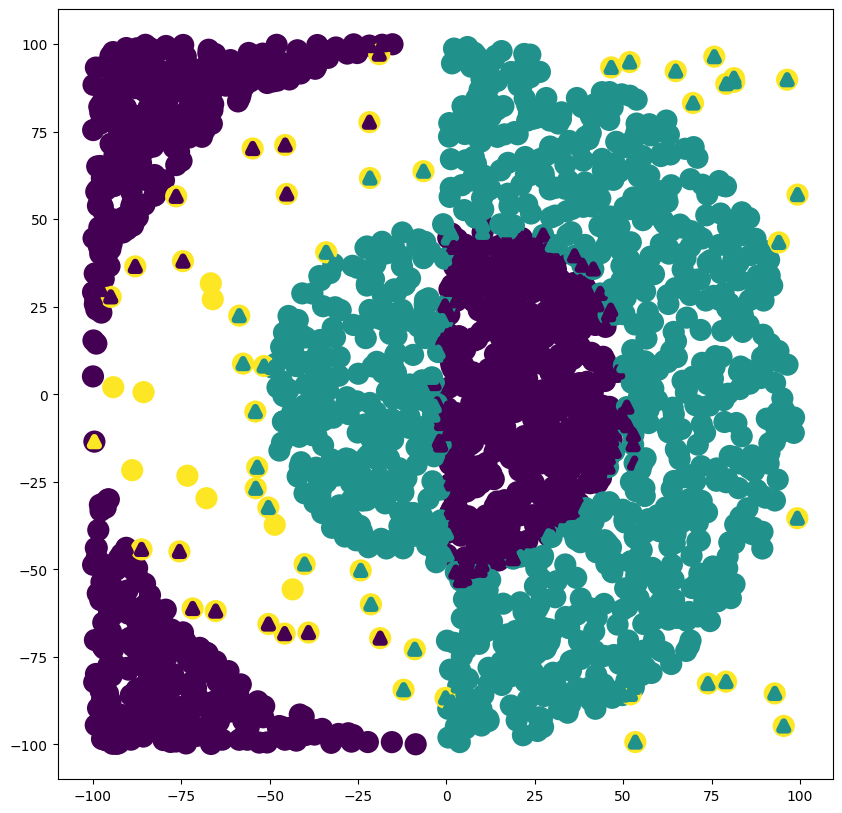

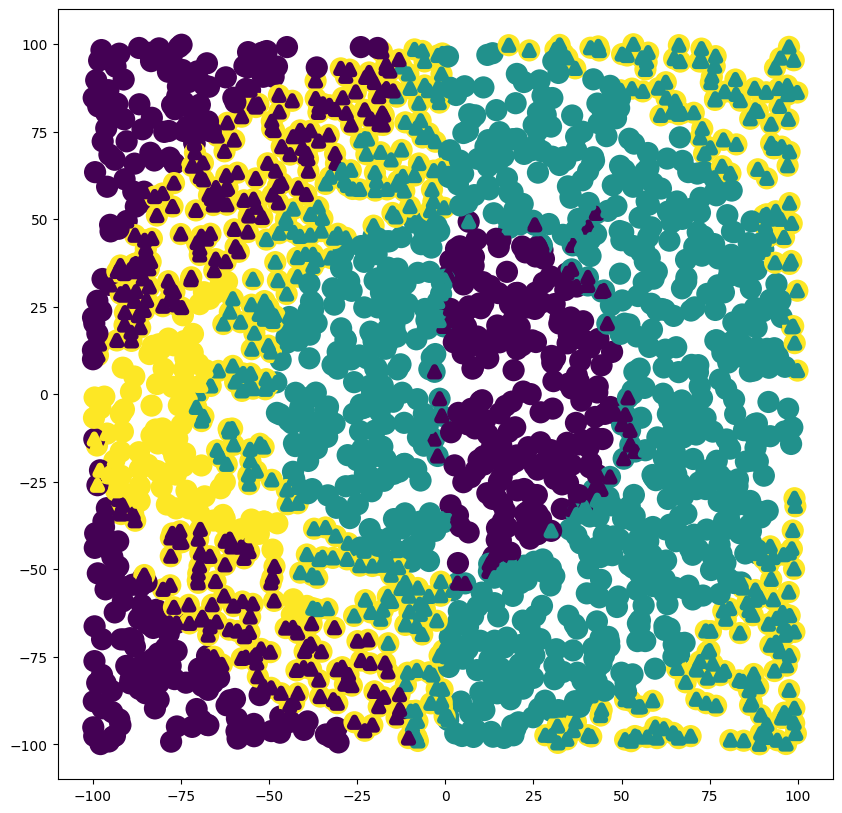

In [18]:
df = pd.read_csv('mio1/classification/rings3-balance-training.csv')
X = df.iloc[:, :-1].to_numpy()
y = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_true = one_hot_encode(y, 3)

df = pd.read_csv('mio1/classification/rings3-balance-test.csv')
X_test = df.iloc[:, :-1].to_numpy()
y_test = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_true_test = one_hot_encode(y_test, 3)

mlp = MLP([2,8,6,4,3], 'relu', 'softmax', "cross-entropy")

mlp.fit(X, y_true,50000, 0.000001, er=1, momentum=0, RMS=0,reg=0,lambda_reg=0,test_stop=0,patience=float('inf'), X_test=X_test, y_test=y_true_test, norm=0)


y_prob = mlp.predict(X,0)
y_pred =mlp.softmax_to_one_hot(y_prob)
y_pred_col = mlp.convert_to_class_indices(y_pred)
F = mlp.f1_score(y_pred=y_pred, y_true=y_true)
print("Train F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=2)
plt.scatter(X[:, 0], X[:, 1], c=y_pred_col, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=2)



y_prob_test = mlp.predict(X_test,0)
y_pred_test = mlp.softmax_to_one_hot(y_prob_test)
y_pred_col_test = mlp.convert_to_class_indices(y_pred_test)
F = mlp.f1_score(y_pred=y_pred_test, y_true=y_true_test)
print("Test F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=2)
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_pred_col_test, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=2)


#### regularyzacja L1 lambda=0.1

Epoch 1000/100000, Train Loss: 0.39615698170411157, Test Loss: 0.3114531249558912
Epoch 2000/100000, Train Loss: 0.43401724571322614, Test Loss: 0.3375548266369801
Epoch 3000/100000, Train Loss: 0.4345071945134853, Test Loss: 0.3388046857617833
Epoch 4000/100000, Train Loss: 0.4302411055157181, Test Loss: 0.33511436221430274
Epoch 5000/100000, Train Loss: 0.4318969803193813, Test Loss: 0.33154058268533526
Epoch 6000/100000, Train Loss: 0.4396121152357635, Test Loss: 0.33308128572875256
Epoch 7000/100000, Train Loss: 0.44693165201231316, Test Loss: 0.33842949938421735
Epoch 8000/100000, Train Loss: 0.45604781666060973, Test Loss: 0.34318668503998545
Epoch 9000/100000, Train Loss: 0.4661348419638922, Test Loss: 0.3501062251368498
Epoch 10000/100000, Train Loss: 0.47134662415098666, Test Loss: 0.3559258456260747
Epoch 11000/100000, Train Loss: 0.4787936760499522, Test Loss: 0.3598982353130389
Epoch 12000/100000, Train Loss: 0.4888981383231963, Test Loss: 0.36474550146616513
Epoch 13000/10

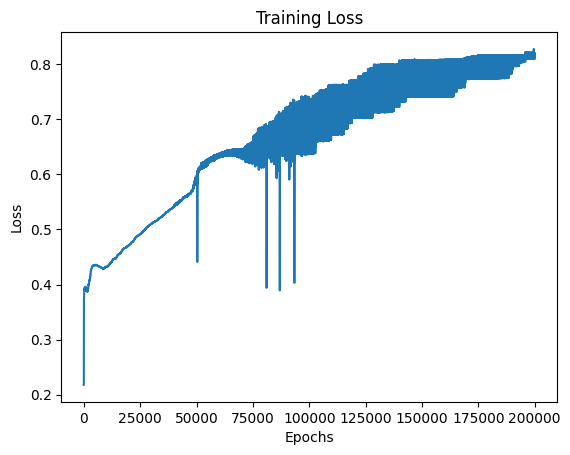

Train F-measure:  0.8196385210138125
Test F-measure:  0.7003707681239909


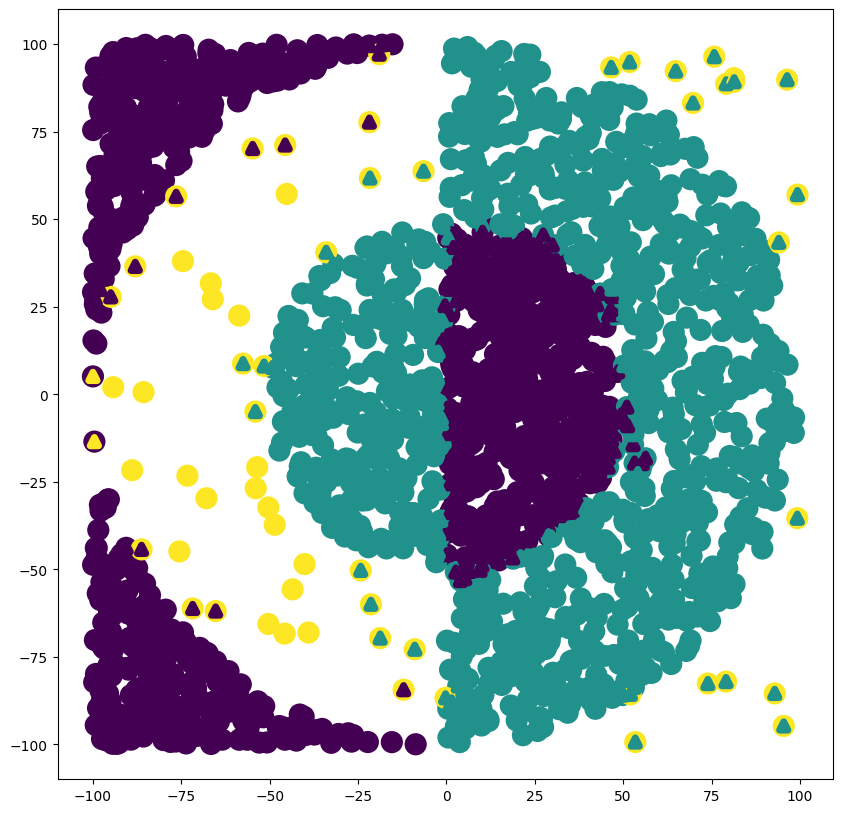

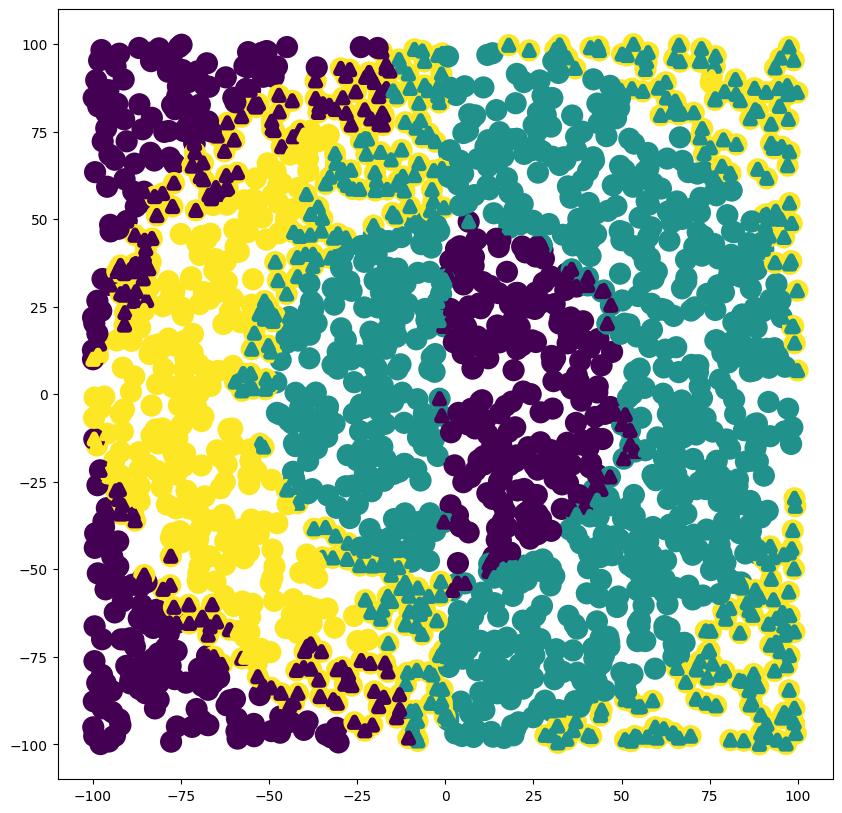

In [21]:
df = pd.read_csv('mio1/classification/rings3-balance-training.csv')
X = df.iloc[:, :-1].to_numpy()
y = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_true = one_hot_encode(y, 3)

df = pd.read_csv('mio1/classification/rings3-balance-test.csv')
X_test = df.iloc[:, :-1].to_numpy()
y_test = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_true_test = one_hot_encode(y_test, 3)

mlp = MLP([2,8,6,4,3], 'relu', 'softmax', "cross-entropy")

mlp.fit(X, y_true,100000, 0.000001, er=1, momentum=0, RMS=0,reg=1,lambda_reg=0.1,test_stop=0,patience=float('inf'), X_test=X_test, y_test=y_true_test, norm=0)


y_prob = mlp.predict(X,0)
y_pred =mlp.softmax_to_one_hot(y_prob)
y_pred_col = mlp.convert_to_class_indices(y_pred)
F = mlp.f1_score(y_pred=y_pred, y_true=y_true)
print("Train F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=2)
plt.scatter(X[:, 0], X[:, 1], c=y_pred_col, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=2)



y_prob_test = mlp.predict(X_test,0)
y_pred_test = mlp.softmax_to_one_hot(y_prob_test)
y_pred_col_test = mlp.convert_to_class_indices(y_pred_test)
F = mlp.f1_score(y_pred=y_pred_test, y_true=y_true_test)
print("Test F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=2)
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_pred_col_test, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=2)


#### regularyzacja L2 lambda=0.1

Epoch 1000/100000, Train Loss: 0.39650715359346994, Test Loss: 0.3111252909277061
Epoch 2000/100000, Train Loss: 0.43401724571322614, Test Loss: 0.3375548266369801
Epoch 3000/100000, Train Loss: 0.43420658970005427, Test Loss: 0.3388046857617833
Epoch 4000/100000, Train Loss: 0.4302411055157181, Test Loss: 0.3347928252345074
Epoch 5000/100000, Train Loss: 0.4318969803193813, Test Loss: 0.33154058268533526
Epoch 6000/100000, Train Loss: 0.4396121152357635, Test Loss: 0.33307792371957184
Epoch 7000/100000, Train Loss: 0.4472859109084449, Test Loss: 0.33842949938421735
Epoch 8000/100000, Train Loss: 0.45604781666060973, Test Loss: 0.343187092080035
Epoch 9000/100000, Train Loss: 0.4661348419638922, Test Loss: 0.35064254363126485
Epoch 10000/100000, Train Loss: 0.4716895268858523, Test Loss: 0.3554021206210309
Epoch 11000/100000, Train Loss: 0.47845291840136034, Test Loss: 0.3590370150582862
Epoch 12000/100000, Train Loss: 0.4885775920487314, Test Loss: 0.36474550146616513
Epoch 13000/1000

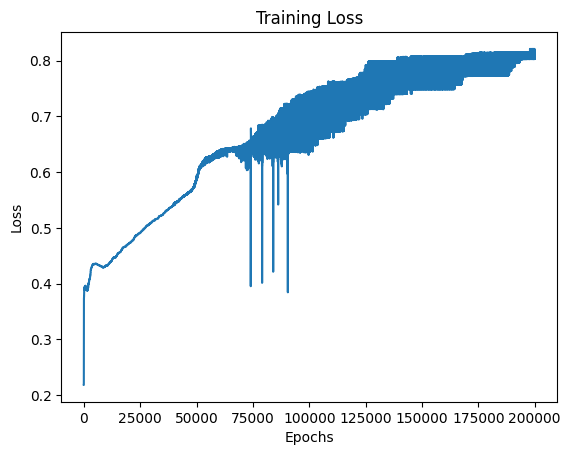

Train F-measure:  0.8127433402550254
Test F-measure:  0.6995209403615691


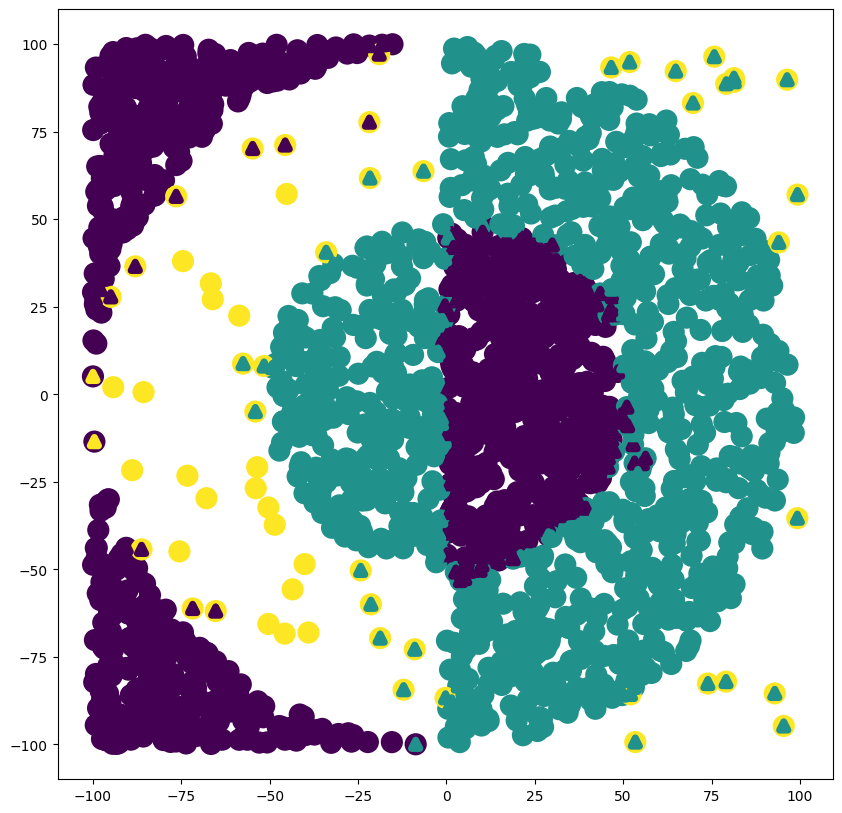

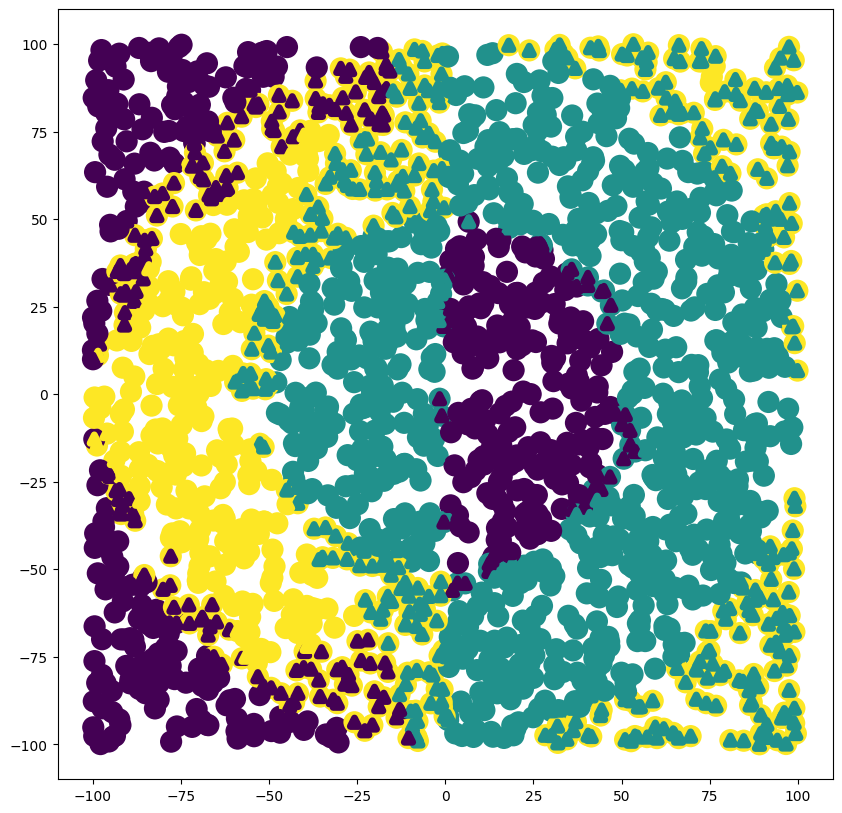

In [22]:
df = pd.read_csv('mio1/classification/rings3-balance-training.csv')
X = df.iloc[:, :-1].to_numpy()
y = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_true = one_hot_encode(y, 3)

df = pd.read_csv('mio1/classification/rings3-balance-test.csv')
X_test = df.iloc[:, :-1].to_numpy()
y_test = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_true_test = one_hot_encode(y_test, 3)

mlp = MLP([2,8,6,4,3], 'relu', 'softmax', "cross-entropy")

mlp.fit(X, y_true,100000, 0.000001, er=1, momentum=0, RMS=0,reg=2,lambda_reg=0.1,test_stop=0,patience=float('inf'), X_test=X_test, y_test=y_true_test, norm=0)


y_prob = mlp.predict(X,0)
y_pred =mlp.softmax_to_one_hot(y_prob)
y_pred_col = mlp.convert_to_class_indices(y_pred)
F = mlp.f1_score(y_pred=y_pred, y_true=y_true)
print("Train F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=2)
plt.scatter(X[:, 0], X[:, 1], c=y_pred_col, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=2)



y_prob_test = mlp.predict(X_test,0)
y_pred_test = mlp.softmax_to_one_hot(y_prob_test)
y_pred_col_test = mlp.convert_to_class_indices(y_pred_test)
F = mlp.f1_score(y_pred=y_pred_test, y_true=y_true_test)
print("Test F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=2)
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_pred_col_test, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=2)


#### zatrzymanie uczenia, jeżeli błąd na zbiorze testowym nie poprawi się w ciągu 1000 epok

Epoch 1000/100000, Train Loss: 0.3968167574518535, Test Loss: 0.3111252909277061
Epoch 2000/100000, Train Loss: 0.43401724571322614, Test Loss: 0.3375548266369801
Epoch 3000/100000, Train Loss: 0.43420658970005427, Test Loss: 0.3388046857617833
Early stopping on epoch 3662: no improvement for 1000 epochs.


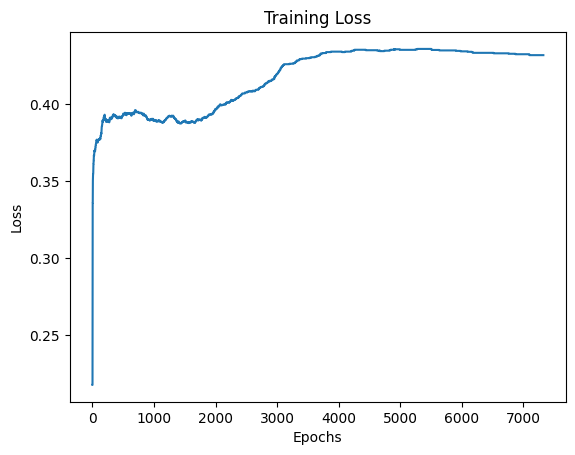

Train F-measure:  0.431745386485416
Test F-measure:  0.3372983655023618


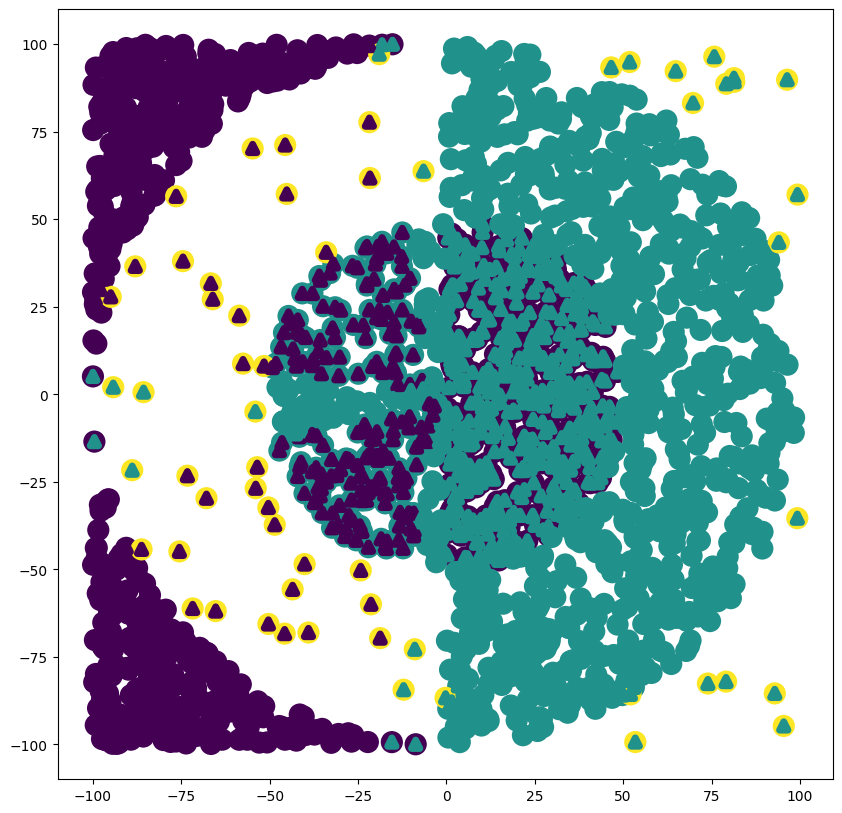

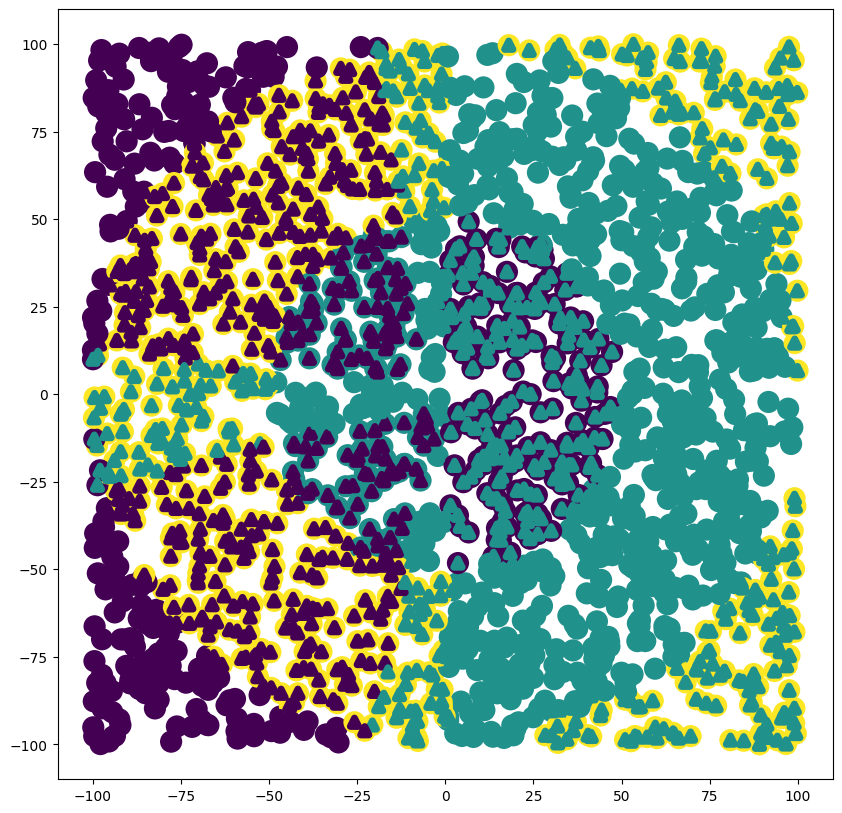

In [25]:
df = pd.read_csv('mio1/classification/rings3-balance-training.csv')
X = df.iloc[:, :-1].to_numpy()
y = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_true = one_hot_encode(y, 3)

df = pd.read_csv('mio1/classification/rings3-balance-test.csv')
X_test = df.iloc[:, :-1].to_numpy()
y_test = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_true_test = one_hot_encode(y_test, 3)

mlp = MLP([2,8,6,4,3], 'relu', 'softmax', "cross-entropy")

mlp.fit(X, y_true,100000, 0.000001, er=1, momentum=0, RMS=0,reg=0,lambda_reg=0,test_stop=1,patience=1000, X_test=X_test, y_test=y_true_test, norm=0)


y_prob = mlp.predict(X,0)
y_pred =mlp.softmax_to_one_hot(y_prob)
y_pred_col = mlp.convert_to_class_indices(y_pred)
F = mlp.f1_score(y_pred=y_pred, y_true=y_true)
print("Train F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=2)
plt.scatter(X[:, 0], X[:, 1], c=y_pred_col, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=2)



y_prob_test = mlp.predict(X_test,0)
y_pred_test = mlp.softmax_to_one_hot(y_prob_test)
y_pred_col_test = mlp.convert_to_class_indices(y_pred_test)
F = mlp.f1_score(y_pred=y_pred_test, y_true=y_true_test)
print("Test F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=2)
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_pred_col_test, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=2)


## Zbiór xor3 balance

#### uczenie bez ulepszeń

Epoch 1000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 2000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 3000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 4000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 5000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 6000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 7000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 8000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 9000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 10000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 11000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 12000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 13000/5

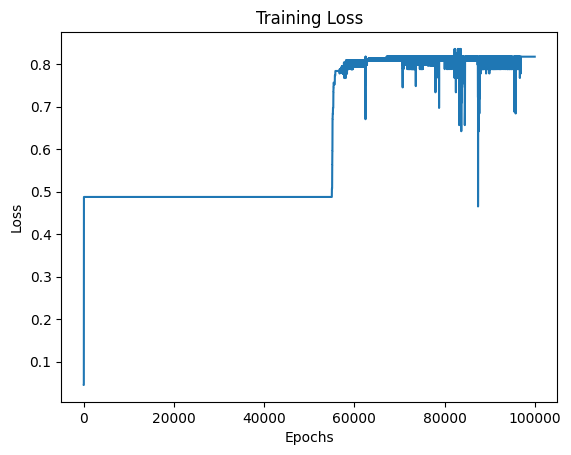

Train F-measure:  0.8179077351380638
Test F-measure:  0.5845734087127361


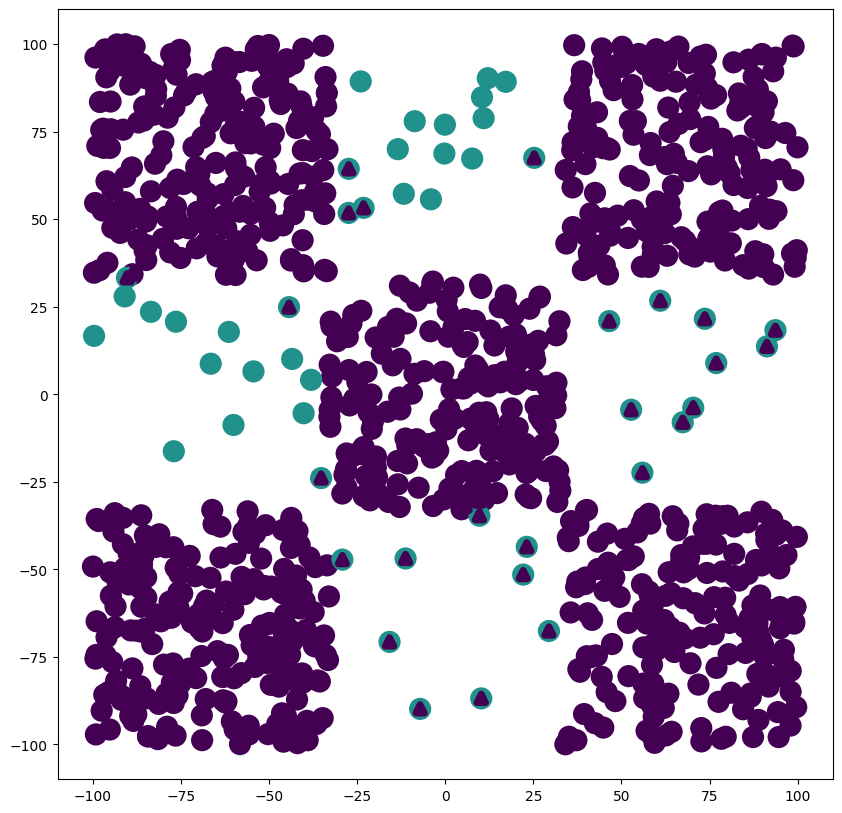

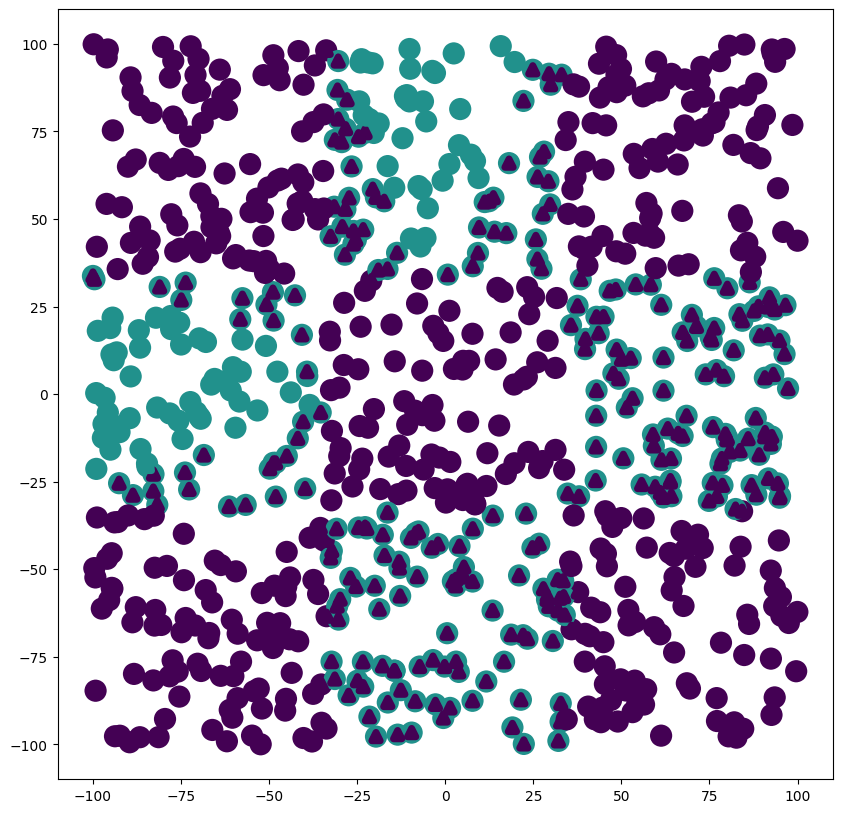

In [35]:
df = pd.read_csv('mio1/classification/xor3-balance-training.csv')
X = df.iloc[:, :-1].to_numpy()
y = df.iloc[:, -1].to_numpy().reshape(-1,1)
y = y.astype(int)
y_true = one_hot_encode(y, 2)

df = pd.read_csv('mio1/classification/xor3-balance-test.csv')
f = pd.read_csv('mio1/classification/xor3-test.csv')
X_test = df.iloc[:, :-1].to_numpy()
y_test = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_test = y_test.astype(int)

y_true_test = one_hot_encode(y_test, 2)

mlp = MLP([2,32,16,8,4,2], 'sigmoid', 'sigmoid', "cross-entropy")

mlp.fit(X, y_true,50000, 0.001, er=1, momentum=0, RMS=0,reg=0,lambda_reg=0,test_stop=0,patience=float('inf'), X_test=X_test, y_test=y_true_test, norm=0)


y_prob = mlp.predict(X,0)
y_pred =mlp.softmax_to_one_hot(y_prob)
y_pred_col = mlp.convert_to_class_indices(y_pred)
F = mlp.f1_score(y_pred=y_pred, y_true=y_true)
print("Train F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=2)
plt.scatter(X[:, 0], X[:, 1], c=y_pred_col, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=2)



y_prob_test = mlp.predict(X_test,0)
y_pred_test = mlp.softmax_to_one_hot(y_prob_test)
y_pred_col_test = mlp.convert_to_class_indices(y_pred_test)
F = mlp.f1_score(y_pred=y_pred_test, y_true=y_true_test)
print("Test F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=2)
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_pred_col_test, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=2)


#### regularyzacja L1 lambda=0.01

Epoch 1000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 2000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 3000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 4000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 5000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 6000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 7000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 8000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 9000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 10000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 11000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 12000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 13000/5

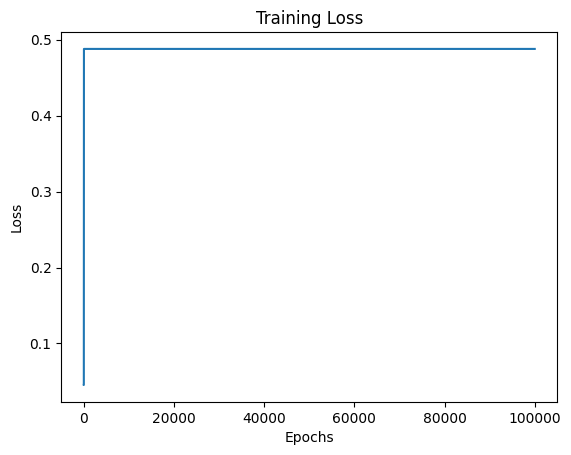

Train F-measure:  0.48780487554550866
Test F-measure:  0.35587761444916394


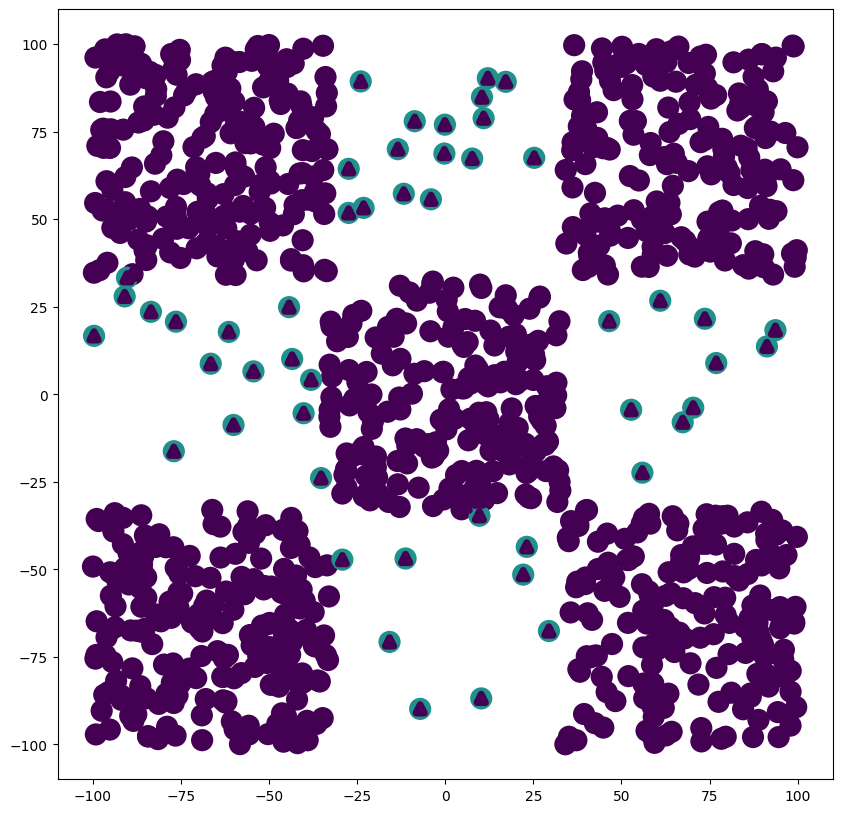

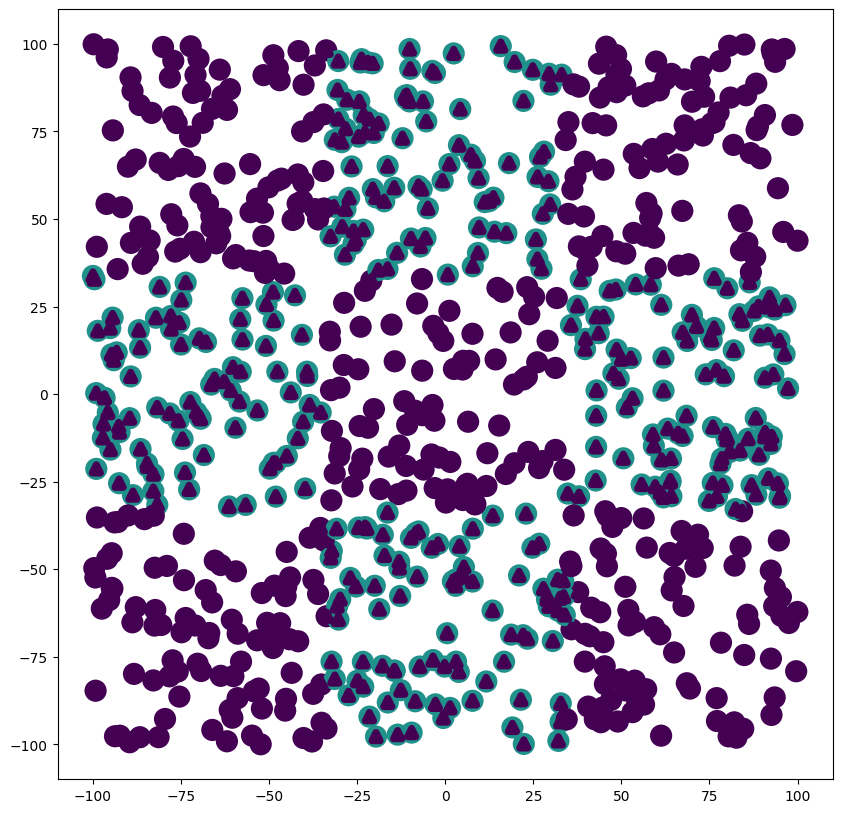

In [36]:
df = pd.read_csv('mio1/classification/xor3-balance-training.csv')
X = df.iloc[:, :-1].to_numpy()
y = df.iloc[:, -1].to_numpy().reshape(-1,1)
y = y.astype(int)
y_true = one_hot_encode(y, 2)

df = pd.read_csv('mio1/classification/xor3-balance-test.csv')
f = pd.read_csv('mio1/classification/xor3-test.csv')
X_test = df.iloc[:, :-1].to_numpy()
y_test = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_test = y_test.astype(int)

y_true_test = one_hot_encode(y_test, 2)

mlp = MLP([2,32,16,8,4,2], 'sigmoid', 'sigmoid', "cross-entropy")

mlp.fit(X, y_true,50000, 0.001, er=1, momentum=0, RMS=0,reg=1,lambda_reg=0.01,test_stop=0,patience=float('inf'), X_test=X_test, y_test=y_true_test, norm=0)


y_prob = mlp.predict(X,0)
y_pred =mlp.softmax_to_one_hot(y_prob)
y_pred_col = mlp.convert_to_class_indices(y_pred)
F = mlp.f1_score(y_pred=y_pred, y_true=y_true)
print("Train F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=2)
plt.scatter(X[:, 0], X[:, 1], c=y_pred_col, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=2)



y_prob_test = mlp.predict(X_test,0)
y_pred_test = mlp.softmax_to_one_hot(y_prob_test)
y_pred_col_test = mlp.convert_to_class_indices(y_pred_test)
F = mlp.f1_score(y_pred=y_pred_test, y_true=y_true_test)
print("Test F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=2)
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_pred_col_test, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=2)


#### regularyzacja L2 lambda=0.01

Epoch 1000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 2000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 3000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 4000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 5000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 6000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 7000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 8000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 9000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 10000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 11000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 12000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 13000/5

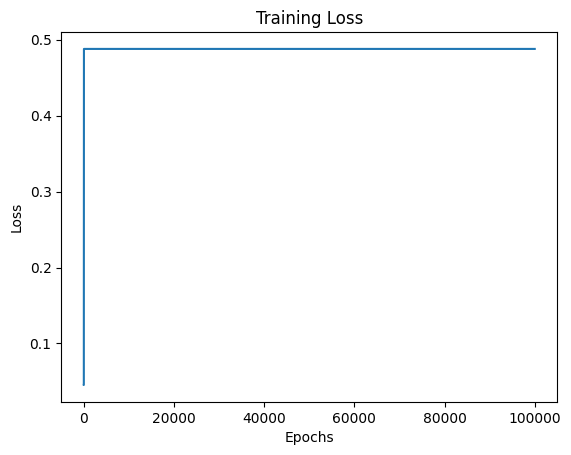

Train F-measure:  0.48780487554550866
Test F-measure:  0.35587761444916394


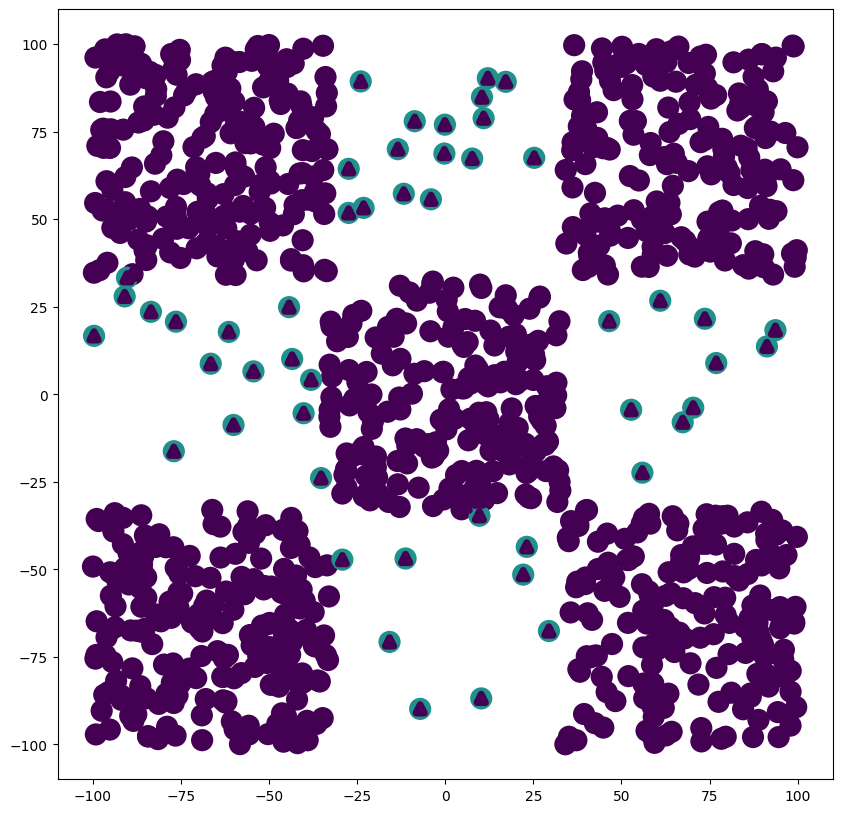

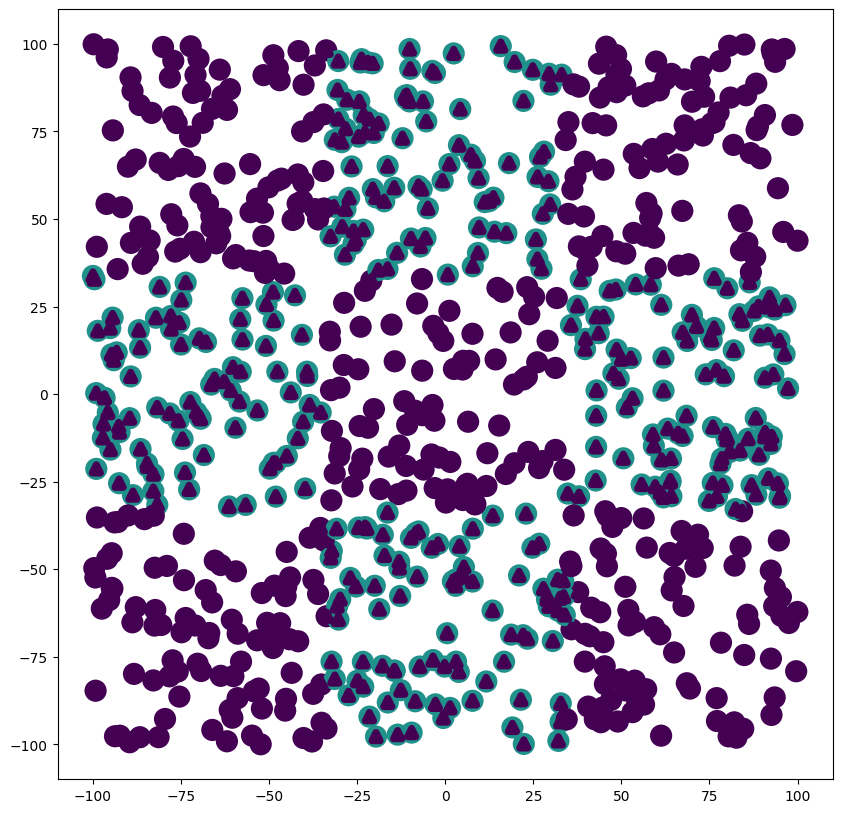

In [37]:
df = pd.read_csv('mio1/classification/xor3-balance-training.csv')
X = df.iloc[:, :-1].to_numpy()
y = df.iloc[:, -1].to_numpy().reshape(-1,1)
y = y.astype(int)
y_true = one_hot_encode(y, 2)

df = pd.read_csv('mio1/classification/xor3-balance-test.csv')
f = pd.read_csv('mio1/classification/xor3-test.csv')
X_test = df.iloc[:, :-1].to_numpy()
y_test = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_test = y_test.astype(int)

y_true_test = one_hot_encode(y_test, 2)

mlp = MLP([2,32,16,8,4,2], 'sigmoid', 'sigmoid', "cross-entropy")

mlp.fit(X, y_true,50000, 0.001, er=1, momentum=0, RMS=0,reg=2,lambda_reg=0.01,test_stop=0,patience=float('inf'), X_test=X_test, y_test=y_true_test, norm=0)


y_prob = mlp.predict(X,0)
y_pred =mlp.softmax_to_one_hot(y_prob)
y_pred_col = mlp.convert_to_class_indices(y_pred)
F = mlp.f1_score(y_pred=y_pred, y_true=y_true)
print("Train F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=2)
plt.scatter(X[:, 0], X[:, 1], c=y_pred_col, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=2)



y_prob_test = mlp.predict(X_test,0)
y_pred_test = mlp.softmax_to_one_hot(y_prob_test)
y_pred_col_test = mlp.convert_to_class_indices(y_pred_test)
F = mlp.f1_score(y_pred=y_pred_test, y_true=y_true_test)
print("Test F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=2)
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_pred_col_test, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=2)


#### regularyzacja L1 lambda=0.1

Epoch 1000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 2000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 3000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 4000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 5000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 6000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 7000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 8000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 9000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 10000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 11000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 12000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 13000/5

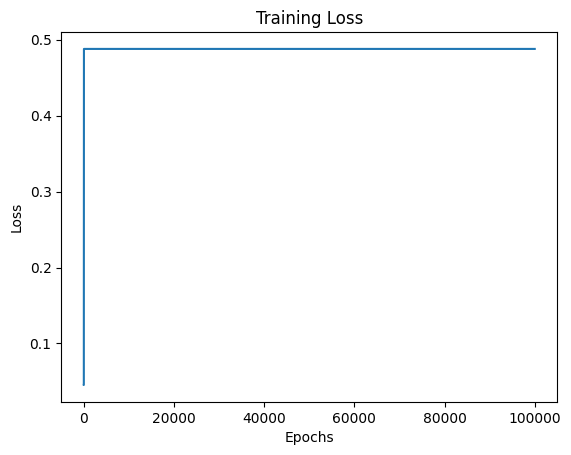

Train F-measure:  0.48780487554550866
Test F-measure:  0.35587761444916394


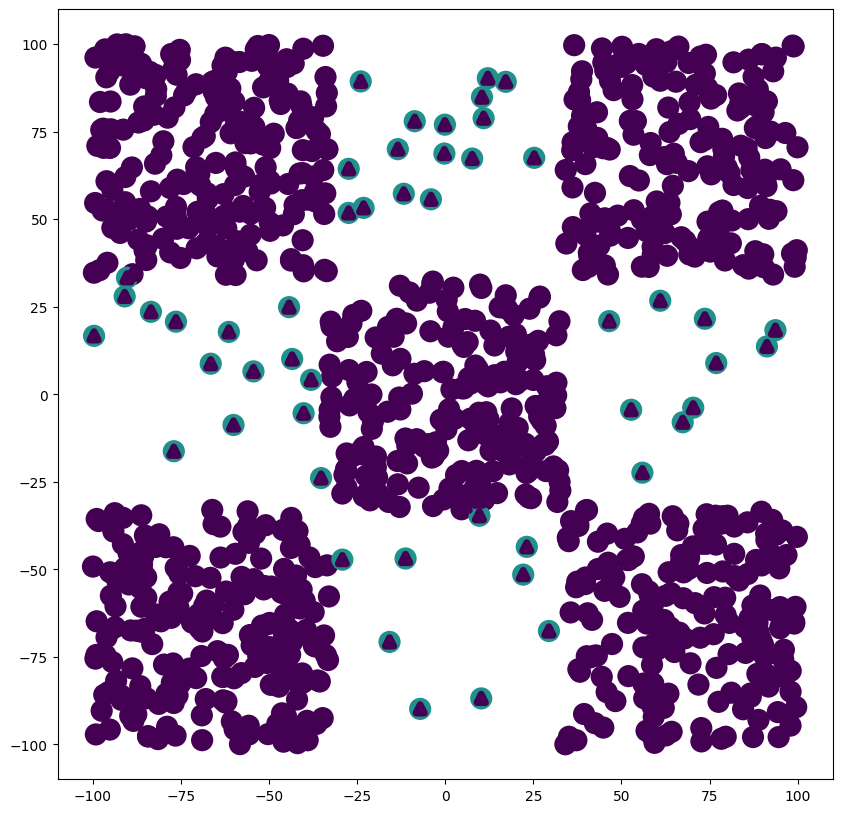

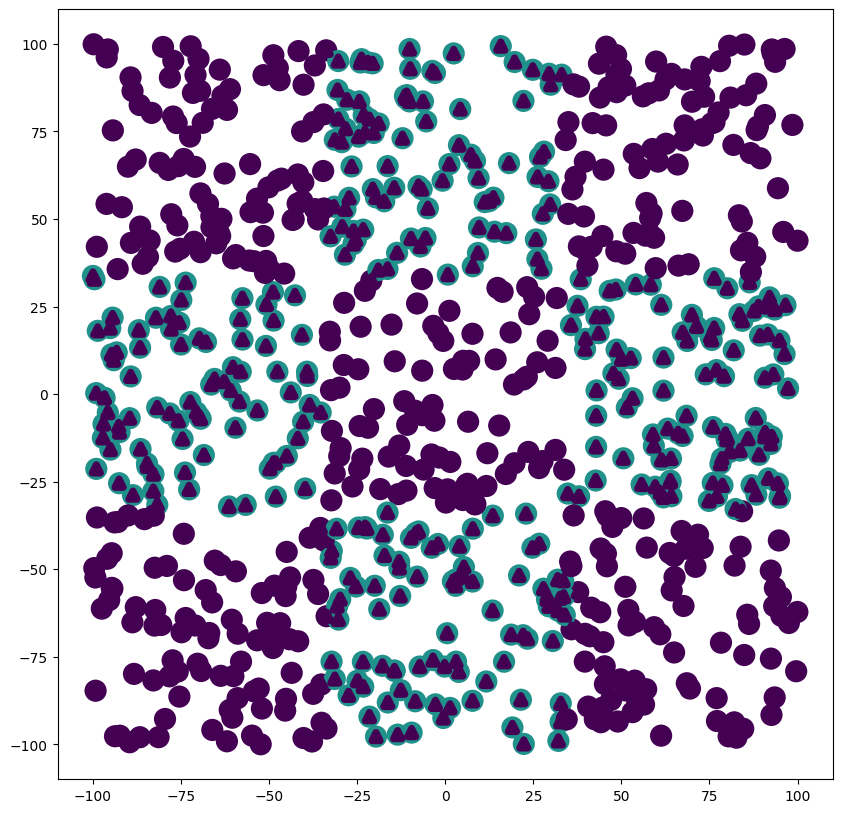

In [38]:
df = pd.read_csv('mio1/classification/xor3-balance-training.csv')
X = df.iloc[:, :-1].to_numpy()
y = df.iloc[:, -1].to_numpy().reshape(-1,1)
y = y.astype(int)
y_true = one_hot_encode(y, 2)

df = pd.read_csv('mio1/classification/xor3-balance-test.csv')
f = pd.read_csv('mio1/classification/xor3-test.csv')
X_test = df.iloc[:, :-1].to_numpy()
y_test = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_test = y_test.astype(int)

y_true_test = one_hot_encode(y_test, 2)

mlp = MLP([2,32,16,8,4,2], 'sigmoid', 'sigmoid', "cross-entropy")

mlp.fit(X, y_true,50000, 0.001, er=1, momentum=0, RMS=0,reg=1,lambda_reg=0.1,test_stop=0,patience=float('inf'), X_test=X_test, y_test=y_true_test, norm=0)


y_prob = mlp.predict(X,0)
y_pred =mlp.softmax_to_one_hot(y_prob)
y_pred_col = mlp.convert_to_class_indices(y_pred)
F = mlp.f1_score(y_pred=y_pred, y_true=y_true)
print("Train F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=2)
plt.scatter(X[:, 0], X[:, 1], c=y_pred_col, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=2)



y_prob_test = mlp.predict(X_test,0)
y_pred_test = mlp.softmax_to_one_hot(y_prob_test)
y_pred_col_test = mlp.convert_to_class_indices(y_pred_test)
F = mlp.f1_score(y_pred=y_pred_test, y_true=y_true_test)
print("Test F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=2)
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_pred_col_test, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=2)


#### regularyzacja L2 lambda=0.1

Epoch 1000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 2000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 3000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 4000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 5000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 6000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 7000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 8000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 9000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 10000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 11000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 12000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 13000/5

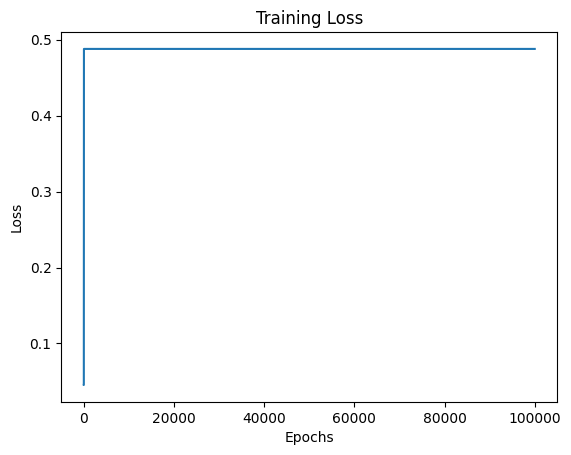

Train F-measure:  0.48780487554550866
Test F-measure:  0.35587761444916394


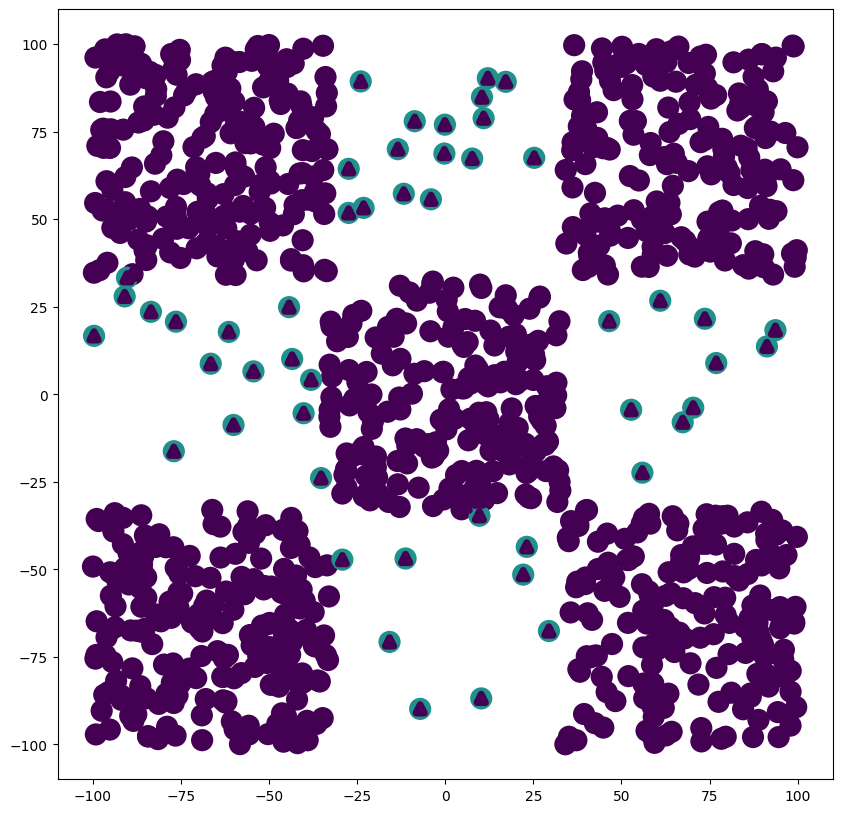

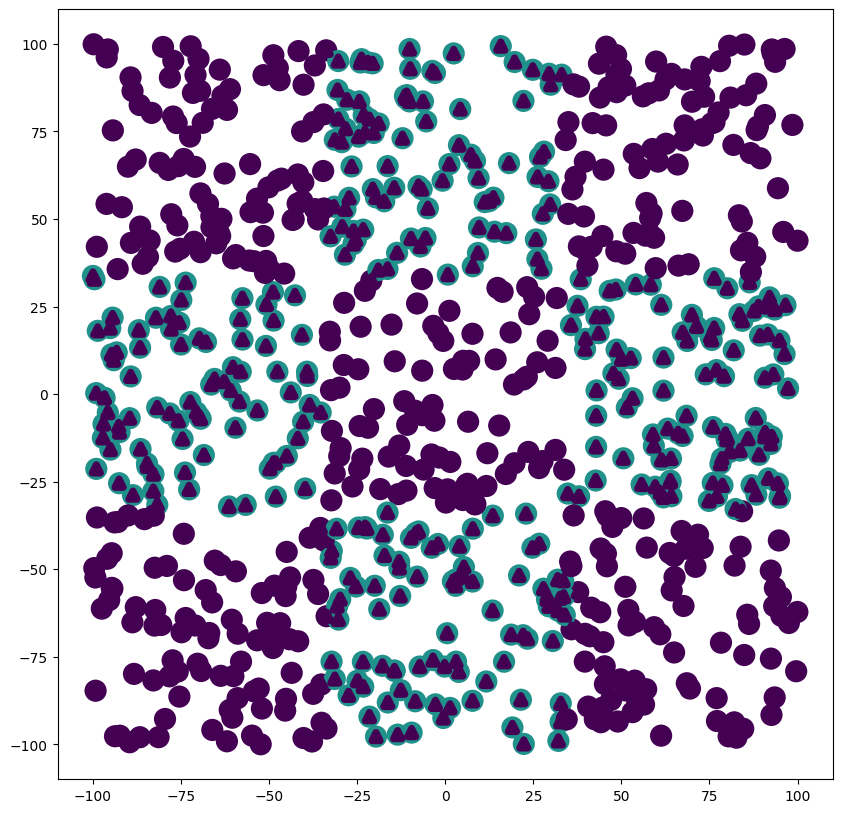

In [39]:
df = pd.read_csv('mio1/classification/xor3-balance-training.csv')
X = df.iloc[:, :-1].to_numpy()
y = df.iloc[:, -1].to_numpy().reshape(-1,1)
y = y.astype(int)
y_true = one_hot_encode(y, 2)

df = pd.read_csv('mio1/classification/xor3-balance-test.csv')
f = pd.read_csv('mio1/classification/xor3-test.csv')
X_test = df.iloc[:, :-1].to_numpy()
y_test = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_test = y_test.astype(int)

y_true_test = one_hot_encode(y_test, 2)

mlp = MLP([2,32,16,8,4,2], 'sigmoid', 'sigmoid', "cross-entropy")

mlp.fit(X, y_true,50000, 0.001, er=1, momentum=0, RMS=0,reg=2,lambda_reg=0.1,test_stop=0,patience=float('inf'), X_test=X_test, y_test=y_true_test, norm=0)


y_prob = mlp.predict(X,0)
y_pred =mlp.softmax_to_one_hot(y_prob)
y_pred_col = mlp.convert_to_class_indices(y_pred)
F = mlp.f1_score(y_pred=y_pred, y_true=y_true)
print("Train F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=2)
plt.scatter(X[:, 0], X[:, 1], c=y_pred_col, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=2)



y_prob_test = mlp.predict(X_test,0)
y_pred_test = mlp.softmax_to_one_hot(y_prob_test)
y_pred_col_test = mlp.convert_to_class_indices(y_pred_test)
F = mlp.f1_score(y_pred=y_pred_test, y_true=y_true_test)
print("Test F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=2)
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_pred_col_test, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=2)


#### regularyzacja L1 lambda=1

Epoch 1000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 2000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 3000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 4000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 5000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 6000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 7000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 8000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 9000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 10000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 11000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 12000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 13000/5

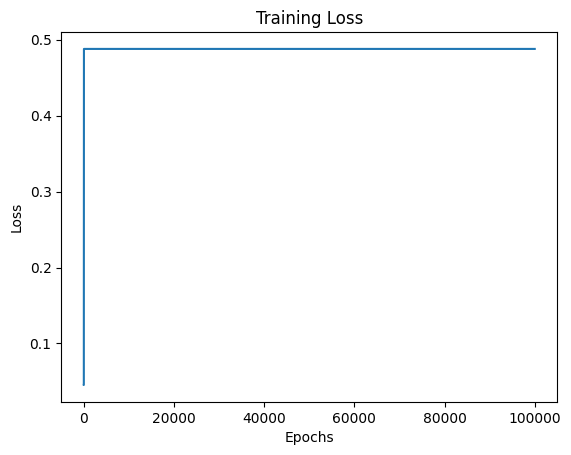

Train F-measure:  0.48780487554550866
Test F-measure:  0.35587761444916394


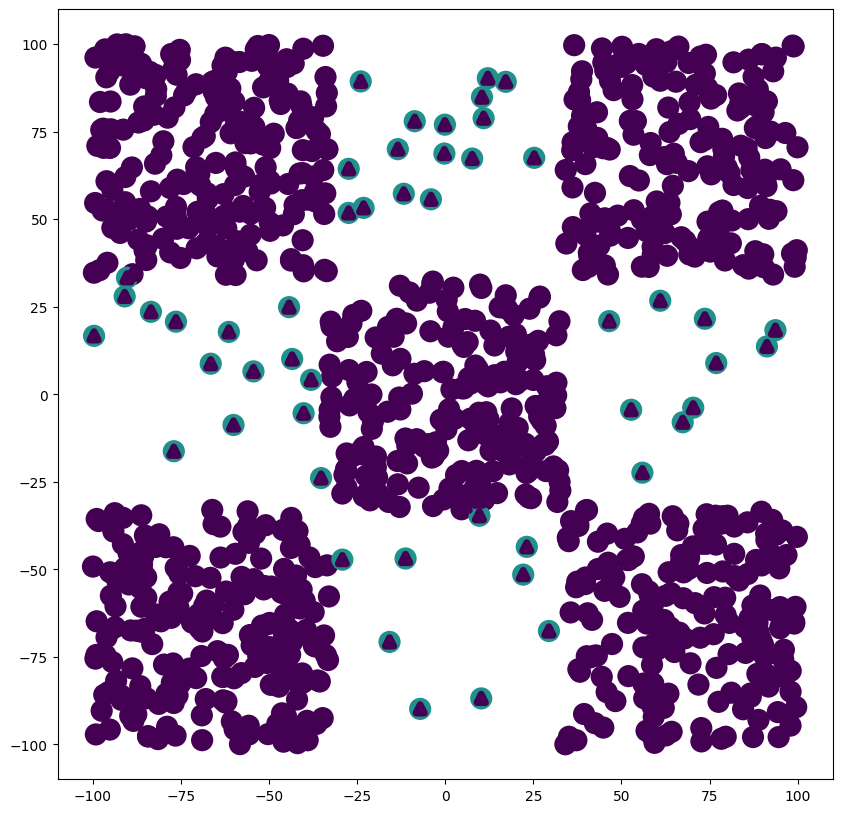

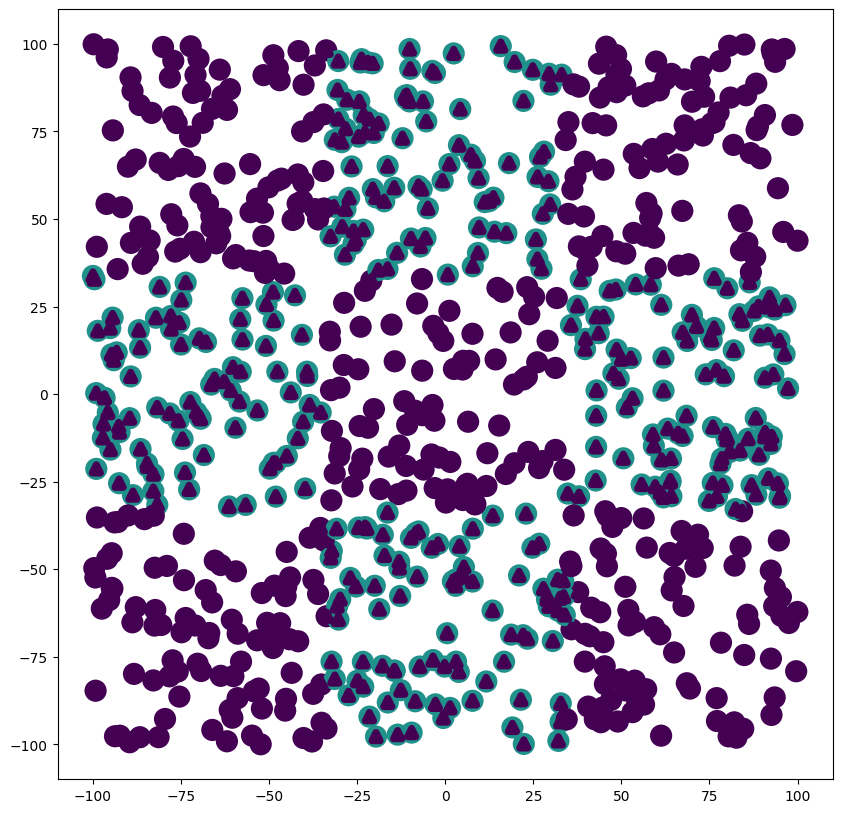

In [40]:
df = pd.read_csv('mio1/classification/xor3-balance-training.csv')
X = df.iloc[:, :-1].to_numpy()
y = df.iloc[:, -1].to_numpy().reshape(-1,1)
y = y.astype(int)
y_true = one_hot_encode(y, 2)

df = pd.read_csv('mio1/classification/xor3-balance-test.csv')
f = pd.read_csv('mio1/classification/xor3-test.csv')
X_test = df.iloc[:, :-1].to_numpy()
y_test = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_test = y_test.astype(int)

y_true_test = one_hot_encode(y_test, 2)

mlp = MLP([2,32,16,8,4,2], 'sigmoid', 'sigmoid', "cross-entropy")

mlp.fit(X, y_true,50000, 0.001, er=1, momentum=0, RMS=0,reg=1,lambda_reg=1,test_stop=0,patience=float('inf'), X_test=X_test, y_test=y_true_test, norm=0)


y_prob = mlp.predict(X,0)
y_pred =mlp.softmax_to_one_hot(y_prob)
y_pred_col = mlp.convert_to_class_indices(y_pred)
F = mlp.f1_score(y_pred=y_pred, y_true=y_true)
print("Train F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=2)
plt.scatter(X[:, 0], X[:, 1], c=y_pred_col, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=2)



y_prob_test = mlp.predict(X_test,0)
y_pred_test = mlp.softmax_to_one_hot(y_prob_test)
y_pred_col_test = mlp.convert_to_class_indices(y_pred_test)
F = mlp.f1_score(y_pred=y_pred_test, y_true=y_true_test)
print("Test F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=2)
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_pred_col_test, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=2)


#### regularyzacja L2 lambda=1

Epoch 1000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 2000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 3000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 4000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 5000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 6000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 7000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 8000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 9000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 10000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 11000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 12000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Epoch 13000/5

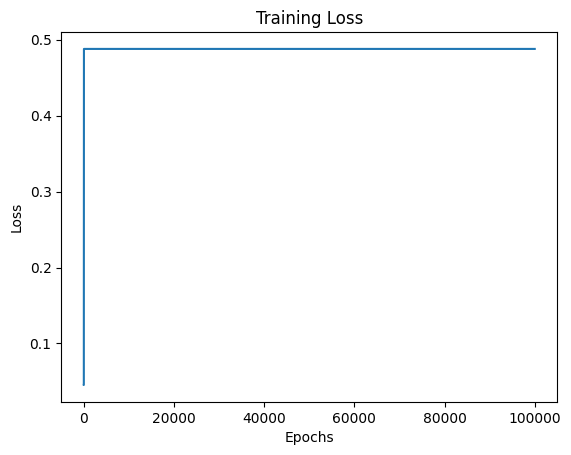

Train F-measure:  0.48780487554550866
Test F-measure:  0.35587761444916394


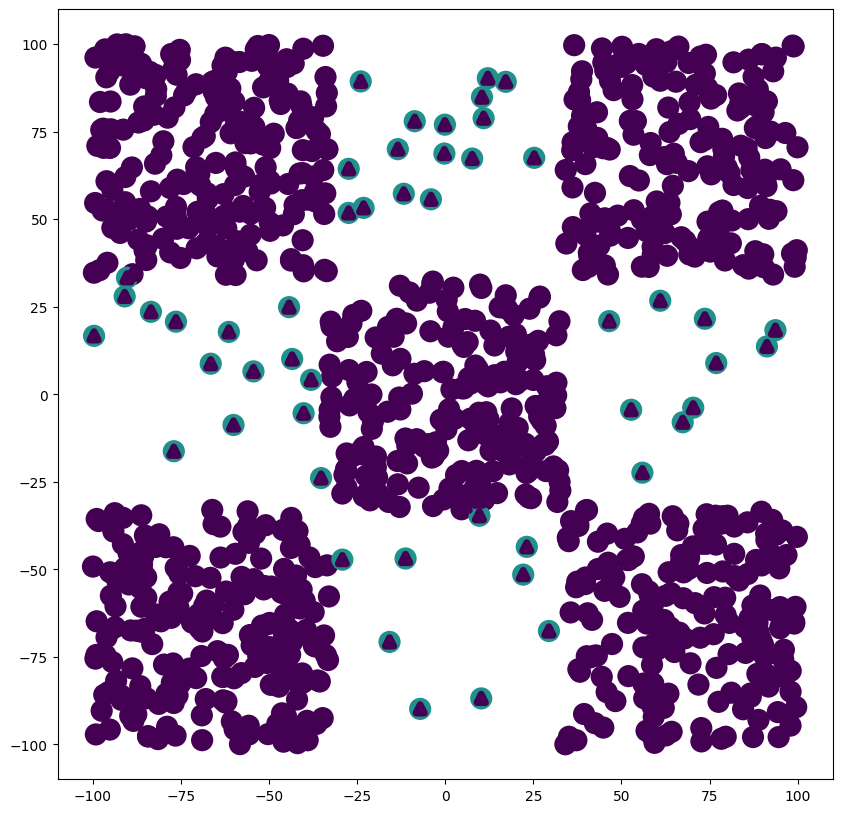

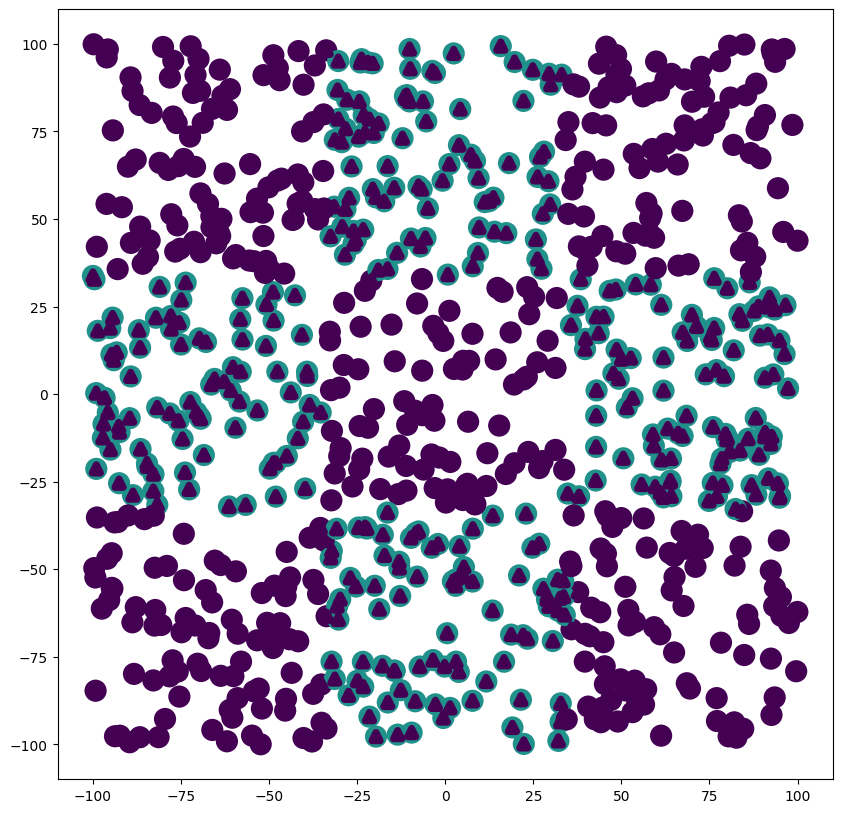

In [41]:
df = pd.read_csv('mio1/classification/xor3-balance-training.csv')
X = df.iloc[:, :-1].to_numpy()
y = df.iloc[:, -1].to_numpy().reshape(-1,1)
y = y.astype(int)
y_true = one_hot_encode(y, 2)

df = pd.read_csv('mio1/classification/xor3-balance-test.csv')
f = pd.read_csv('mio1/classification/xor3-test.csv')
X_test = df.iloc[:, :-1].to_numpy()
y_test = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_test = y_test.astype(int)

y_true_test = one_hot_encode(y_test, 2)

mlp = MLP([2,32,16,8,4,2], 'sigmoid', 'sigmoid', "cross-entropy")

mlp.fit(X, y_true,50000, 0.001, er=1, momentum=0, RMS=0,reg=2,lambda_reg=1,test_stop=0,patience=float('inf'), X_test=X_test, y_test=y_true_test, norm=0)


y_prob = mlp.predict(X,0)
y_pred =mlp.softmax_to_one_hot(y_prob)
y_pred_col = mlp.convert_to_class_indices(y_pred)
F = mlp.f1_score(y_pred=y_pred, y_true=y_true)
print("Train F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=2)
plt.scatter(X[:, 0], X[:, 1], c=y_pred_col, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=2)



y_prob_test = mlp.predict(X_test,0)
y_pred_test = mlp.softmax_to_one_hot(y_prob_test)
y_pred_col_test = mlp.convert_to_class_indices(y_pred_test)
F = mlp.f1_score(y_pred=y_pred_test, y_true=y_true_test)
print("Test F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=2)
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_pred_col_test, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=2)


#### zatrzymanie uczenia, jeżeli błąd na zbiorze testowym nie poprawi się w ciągu 1000 epok

Epoch 1000/50000, Train Loss: 0.48780487554550866, Test Loss: 0.35587761444916394
Early stopping on epoch 1001: no improvement for 1000 epochs.


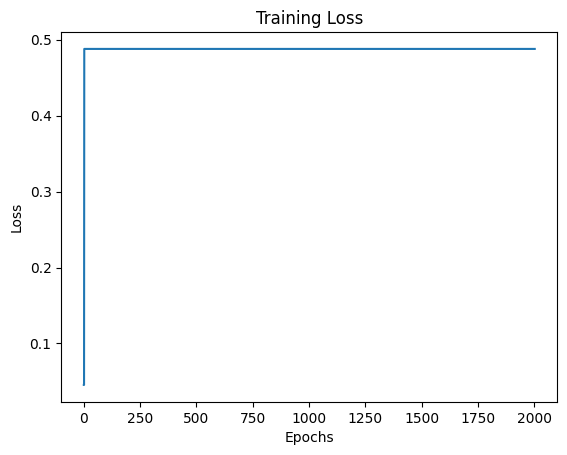

Train F-measure:  0.48780487554550866
Test F-measure:  0.35587761444916394


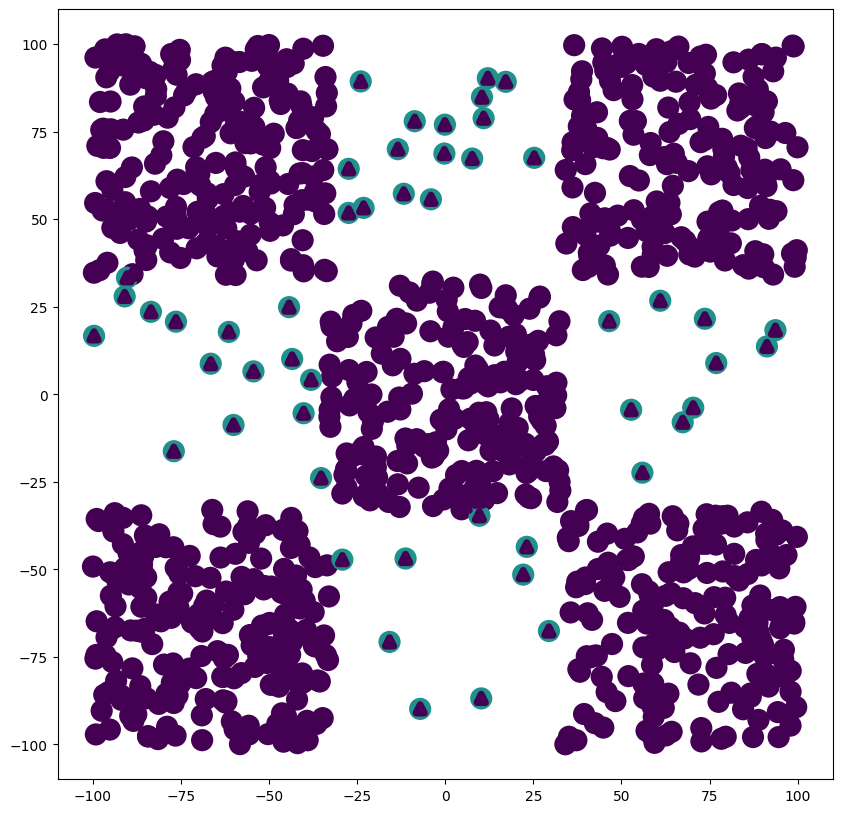

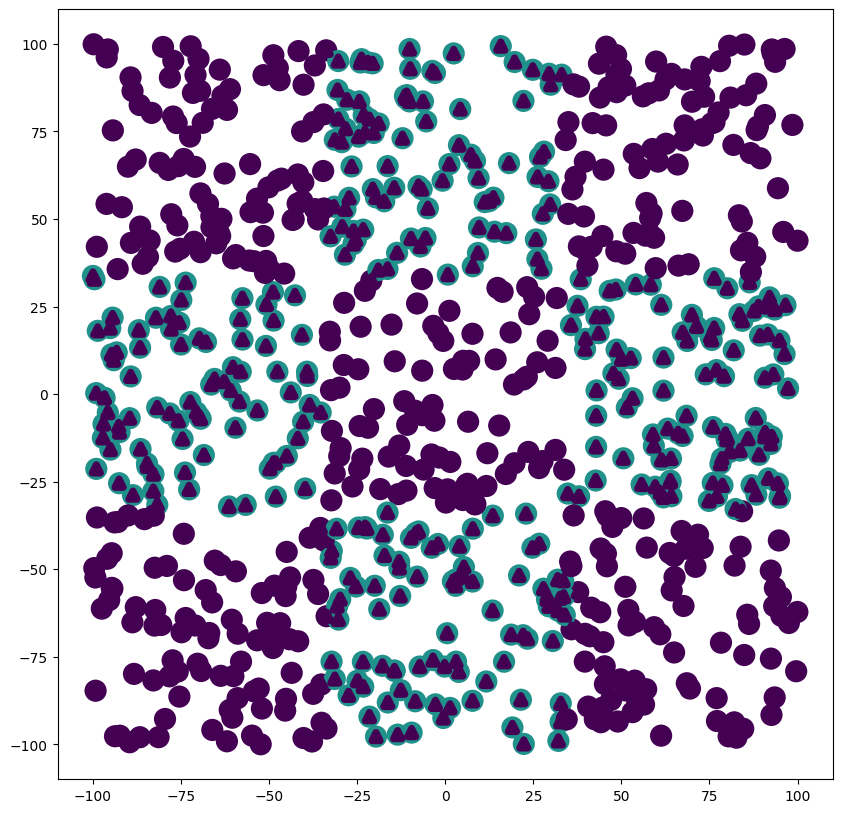

In [42]:
df = pd.read_csv('mio1/classification/xor3-balance-training.csv')
X = df.iloc[:, :-1].to_numpy()
y = df.iloc[:, -1].to_numpy().reshape(-1,1)
y = y.astype(int)
y_true = one_hot_encode(y, 2)

df = pd.read_csv('mio1/classification/xor3-balance-test.csv')
f = pd.read_csv('mio1/classification/xor3-test.csv')
X_test = df.iloc[:, :-1].to_numpy()
y_test = df.iloc[:, -1].to_numpy().reshape(-1,1)
y_test = y_test.astype(int)

y_true_test = one_hot_encode(y_test, 2)

mlp = MLP([2,32,16,8,4,2], 'sigmoid', 'sigmoid', "cross-entropy")

mlp.fit(X, y_true,50000, 0.001, er=1, momentum=0, RMS=0,reg=0,lambda_reg=0,test_stop=1,patience=1000, X_test=X_test, y_test=y_true_test, norm=0)


y_prob = mlp.predict(X,0)
y_pred =mlp.softmax_to_one_hot(y_prob)
y_pred_col = mlp.convert_to_class_indices(y_pred)
F = mlp.f1_score(y_pred=y_pred, y_true=y_true)
print("Train F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=2)
plt.scatter(X[:, 0], X[:, 1], c=y_pred_col, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=2)



y_prob_test = mlp.predict(X_test,0)
y_pred_test = mlp.softmax_to_one_hot(y_prob_test)
y_pred_col_test = mlp.convert_to_class_indices(y_pred_test)
F = mlp.f1_score(y_pred=y_pred_test, y_true=y_true_test)
print("Test F-measure: ", F)
plt.figure(figsize=(10, 10))

plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap='viridis', marker='o', linewidths=10, vmin=0, vmax=2)
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_pred_col_test, cmap='viridis', marker='^', linewidths= 5, vmin=0, vmax=2)
